In [1]:
import os
import sys
from dask.distributed import Client
# client = Client(scheduler_file='/proj/kimyy/Dropbox/source/python/all/mpi/scheduler.json', threads_per_worker=2, n_workers=6)
client = Client(scheduler_file='/proj/kimyy/Dropbox/source/python/all/mpi/scheduler.json')  
# client = Client(scheduler_file='/proj/kimyy/Dropbox/source/python/all/mpi/scheduler_10.json')  

# add private module path for workers
# client.run(lambda: os.environ.update({'PYTHONPATH': '/proj/kimyy/Dropbox/source/python/all/Modules/CESM2'}))
# def add_path():
#     if '/proj/kimyy/Dropbox/source/python/all/Modules/CESM2' not in sys.path:
#         sys.path.append('/proj/kimyy/Dropbox/source/python/all/Modules/CESM2')

# client.run(add_path)

def setup_module_path():
    module_path = '/proj/kimyy/Dropbox/source/python/all/Modules/CESM2'
    if module_path not in sys.path:
        sys.path.append(module_path)

client.run(setup_module_path)

client

<Client: 'tcp://203.247.189.224:32795' processes=5 threads=90, memory=419.10 GiB>

# Load modules

In [2]:
# load public modules

import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from scipy import stats
import cmocean
from cmcrameri import cm
import warnings
warnings.simplefilter(action='ignore')
import pandas as pd
import cftime
import pop_tools
from pprint import pprint
import time
import subprocess
import re as re_mod
import cftime
import datetime
from scipy.stats import ttest_1samp

In [3]:
# load private modules

import sys
sys.path.append('/proj/kimyy/Dropbox/source/python/all/Modules/CESM2')
from KYY_CESM2_preprocessing import CESM2_config
# import KYY_CESM2_preprocessing
# import importlib
# importlib.reload(KYY_CESM2_preprocessing)

# Variable configuration

In [4]:
cfg_var_TWS=CESM2_config()
cfg_var_TWS.year_s=1960
cfg_var_TWS.year_e=2020
cfg_var_TWS.setvar('TWS')
cfg_var_TWS.list()

if cfg_var_TWS.comp=='ocn':
    ds_grid = pop_tools.get_grid('POP_gx1v7')


cfg_var_GPP=CESM2_config()
cfg_var_GPP.year_s=1960
cfg_var_GPP.year_e=2020
cfg_var_GPP.setvar('GPP')


cfg_var_PRECT=CESM2_config()
cfg_var_PRECT.year_s=1960
cfg_var_PRECT.year_e=2020
cfg_var_PRECT.setvar('PRECT')

cfg_var_FAREA_BURNED=CESM2_config()
cfg_var_FAREA_BURNED.year_s=1960
cfg_var_FAREA_BURNED.year_e=2020
cfg_var_FAREA_BURNED.setvar('FAREA_BURNED')

cfg_var_SSH=CESM2_config()
cfg_var_SSH.year_s=1960
cfg_var_SSH.year_e=2100
cfg_var_SSH.setvar('SSH')

{'codebase': 'e21',
 'comp': 'lnd',
 'compset': 'b',
 'dimension': 'time '
              'lat '
              'lon',
 'long_name': 'total '
              'water '
              'storage',
 'model': 'clm2.h0',
 'ndim': 3,
 'resol': 'f09_g17',
 'tfreq': 'month_1',
 'unit': 'mm',
 'var': 'TWS',
 'year_e': 2020,
 'year_s': 1960}


# Load file paths

In [5]:
# cfg_var.ODA_path_load(cfg_var.var)
# cfg_var.ADA_path_load(cfg_var.var)
# cfg_var.LE_path_load(cfg_var.var)
# cfg_var.OBS_path_load(cfg_var.var)

# print('  ODA file sample: ')
# print(cfg_var.ODA_file_list[0][0][0])
# print(cfg_var.ODA_file_list[0][0][-1])
# print('  ADA file sample: ')
# print(cfg_var.ADA_file_list[0][0][0])
# print(cfg_var.ADA_file_list[0][0][-1])
# print('  LE file sample: ')
# print(cfg_var.LE_file_list[0][0][0])
# print(cfg_var.LE_file_list[0][0][-1])
# print('  OBS file sample: ')
# print(cfg_var.OBS_file_list[0][0][0])
# print(cfg_var.OBS_file_list[0][0][-1])

# Read files

In [340]:
# define preprocessing function

exceptcv=['time','lon','lat','lev', 'TLONG', 'TLAT', 'z_w', cfg_var_TWS.var, 
          cfg_var_U.var, cfg_var_V.var, cfg_var_PSL.var, cfg_var_SST.var, cfg_var_PRECT.var, cfg_var_GPP.var, cfg_var_FAREA_BURNED.var, cfg_var_SSH.var]
def process_coords(ds, sd, ed,  comp, drop=True, except_coord_vars=exceptcv):
    """Preprocessor function to drop all non-dim coords, which slows down concatenation."""
    coord_vars = []
    for v in np.array(ds.coords) :
        if not v in except_coord_vars:
            coord_vars += [v]
    for v in np.array(ds.data_vars) :
        if not v in except_coord_vars:
            coord_vars += [v]
    if comp == "atm" or comp == "lnd":
        ds['lat'] = ds['lat'].round(4)
        ds['lon'] = ds['lon'].round(4)
    if comp == "ocn" or comp == "ice":
        ds['TLAT'] = ds['TLAT'].round(4)
        ds['TLONG'] = ds['TLONG'].round(4)
    if drop:
        ds= ds.drop(coord_vars)
        ds= ds.sel(time=slice(sd, ed))
        return ds
    else:
        return ds.set_coords(coord_vars)


def process_coords_obs(ds, comp, drop=True, except_coord_vars=['time','lon','lat', 'TLONG', 'TLAT', 'dco2']):
    """Preprocessor function to drop all non-dim coords, which slows down concatenation."""
    coord_vars = []
    for v in np.array(ds.coords) :
        if not v in except_coord_vars:
            coord_vars += [v]
    for v in np.array(ds.data_vars) :
        if not v in except_coord_vars:
            coord_vars += [v]
    if comp == "atm" or comp == "lnd":
        ds['lat'] = ds['lat'].round(4)
        ds['lon'] = ds['lon'].round(4)
    if comp == "ocn" or comp == "ice":
        ds['TLAT'] = ds['TLAT'].round(4)
        ds['TLONG'] = ds['TLONG'].round(4)
    if drop:
        ds= ds.drop(coord_vars)
        return ds
    else:
        return ds.set_coords(coord_vars)

def process_coords_obs_atm(ds, sd, ed, comp, drop=True, except_coord_vars=exceptcv):
    """Preprocessor function to drop all non-dim coords, which slows down concatenation."""
    if comp == "atm" or comp == "lnd":
        ds['lat'] = ds['lat'].round(4)
        ds['lon'] = ds['lon'].round(4)
    if comp == "ocn" or comp == "ice":
        ds['TLAT'] = ds['TLAT'].round(4)
        ds['TLONG'] = ds['TLONG'].round(4)
    if drop:
        # ds= ds.sel(time=slice(sd, ed)).isel(z_t=0)
        # ds_rgd = ds[varname].utils.regrid()
        return ds
    else:
        return ds.set_coords(coord_vars)


def process_coords_atm_surface(ds, sd, ed,  comp, drop=True, except_coord_vars=exceptcv):
    """Preprocessor function to drop all non-dim coords, which slows down concatenation."""
    coord_vars = []
    for v in np.array(ds.coords) :
        if not v in except_coord_vars:
            coord_vars += [v]
    for v in np.array(ds.data_vars) :
        if not v in except_coord_vars:
            coord_vars += [v]
    if drop:
        ds= ds.drop(coord_vars)
        ds= ds.sel(time=slice(sd, ed))
        ds= ds.sel(time=slice(sd, ed)).isel(lev=31)
        return ds
    else:
        return ds.set_coords(coord_vars)


def process_coords_rgd(varname, ds, sd, ed,  comp, drop=True, except_coord_vars=exceptcv):
    """Preprocessor function to drop all non-dim coords, which slows down concatenation."""
    import xcesm
    import numpy as np
    
    coord_vars = []
    for v in np.array(ds.coords) :
        if not v in except_coord_vars:
            coord_vars += [v]
    for v in np.array(ds.data_vars) :
        if not v in except_coord_vars:
            coord_vars += [v]
    if comp == "atm" or comp == "lnd":
        ds['lat'] = ds['lat'].round(4)
        ds['lon'] = ds['lon'].round(4)
    if comp == "ocn" or comp == "ice":
        ds['TLAT'] = ds['TLAT'].round(4)
        ds['TLONG'] = ds['TLONG'].round(4)
    if drop:
        ds= ds.drop(coord_vars)
        # ds= ds.sel(time=slice(sd, ed))
        ds_rgd = ds[varname].utils.regrid()
        return ds_rgd
    else:
        return ds.set_coords(coord_vars)

In [161]:
#TWS
# Read LE dataset (TWS)
start_time = time.time()


cfg_var_TWS.LE_path_load(cfg_var_TWS.var)
cfg_var_TWS.LE_ds = xr.open_mfdataset(cfg_var_TWS.LE_file_list[0], 
                       chunks={'time': 2}, 
                       combine='nested', 
                       concat_dim=[[*cfg_var_TWS.LE_ensembles], 'time'], 
                       parallel=True,
                       preprocess=lambda ds: process_coords(ds, start_date, end_date, 'lnd'),
                       decode_cf=True, 
                       decode_times=True)      


cfg_var_TWS.LE_ds = cfg_var_TWS.LE_ds.rename({"concat_dim": "ens_LE"})
new_time = cfg_var_TWS.LE_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var_TWS.LE_ds.time))
cfg_var_TWS.LE_ds = cfg_var_TWS.LE_ds.assign_coords(time=new_time)
cfg_var_TWS.LE_ds = cfg_var_TWS.LE_ds.compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading LE: ' + str(elapsed_time))


# Read ODA dataset (projd only)
start_time = time.time()

#TWS
cfg_var_TWS.ODA_path_load(cfg_var_TWS.var)

cfg_var_TWS.ODA_ds = xr.open_mfdataset(cfg_var_TWS.ODA_file_list[0][10:20], 
                           chunks={'time': 2}, 
                           combine='nested', 
                           concat_dim=[[*cfg_var_TWS.ODA_ensembles[10:20]], 'time'], 
                           parallel=True,
                           preprocess=lambda ds: process_coords(ds, start_date, end_date, 'lnd'),
                           decode_cf=True, 
                           decode_times=True)

cfg_var_TWS.ODA_ds = cfg_var_TWS.ODA_ds.rename({"concat_dim": "ens_ODA"})
new_time = cfg_var_TWS.ODA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var_TWS.ODA_ds.time))
cfg_var_TWS.ODA_ds = cfg_var_TWS.ODA_ds.assign_coords(time=new_time)
cfg_var_TWS.ODA_ds=cfg_var_TWS.ODA_ds.compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading ODA: ' + str(elapsed_time))


#Read ADA dataset
start_time = time.time()

cfg_var_TWS.ADA_path_load(cfg_var_TWS.var)
cfg_var_TWS.ADA_ds = xr.open_mfdataset(cfg_var_TWS.ADA_file_list[0], 
                       chunks={'time': 2}, 
                       combine='nested',
                       concat_dim=[[*cfg_var_TWS.ADA_ensembles], 'time'], 
                       parallel=True,
                       preprocess=lambda ds: process_coords(ds, start_date, end_date, 'lnd'),
                       decode_cf=True, 
                       decode_times=True)      


cfg_var_TWS.ADA_ds = cfg_var_TWS.ADA_ds.rename({"concat_dim": "ens_ADA"})
new_time = cfg_var_TWS.ADA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var_TWS.ADA_ds.time))
cfg_var_TWS.ADA_ds = cfg_var_TWS.ADA_ds.assign_coords(time=new_time)
cfg_var_TWS.ADA_ds=cfg_var_TWS.ADA_ds.compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading ADA: ' + str(elapsed_time))


# Read OBS dataset (TWS)
start_time = time.time()

cfg_var_TWS.OBS_path_load(cfg_var_TWS.var)
# cfg_var_TWS.OBS_file_list[0]
tmp_comp=cfg_var_TWS.comp
cfg_var_TWS.OBS_ds = []
cfg_var_TWS.OBS_ds = xr.open_mfdataset(cfg_var_TWS.OBS_file_list[0][0],
                       preprocess=lambda ds: process_coords_obs_atm(ds, start_date, end_date, 'lnd'))

cfg_var_TWS.OBS_ds = cfg_var_TWS.OBS_ds.rename({cfg_var_TWS.OBS_var: cfg_var_TWS.var})


end_time = time.time()
elapsed_time = end_time - start_time

cfg_var_TWS.OBS_ds=cfg_var_TWS.OBS_ds.compute()
cfg_var_TWS.OBS_ds = cfg_var_TWS.OBS_ds.rename({'T': 'time'})
cfg_var_TWS.OBS_ds=cfg_var_TWS.OBS_ds.assign_coords(time=cfg_var_TWS.ODA_ds.time)

cfg_var_TWS.OBS_ds['lat'] = cfg_var_TWS.ODA_ds['lat']
cfg_var_TWS.OBS_ds['lon'] = cfg_var_TWS.ODA_ds['lon']

cfg_var_TWS.OBS_ds = cfg_var_TWS.OBS_ds.compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading OBS, ' + ': ' + str(elapsed_time))

elasped time for reading LE: 74.34777021408081
elasped time for reading ODA: 14.365081787109375
elasped time for reading ADA: 14.765105247497559
elasped time for reading OBS, : 30.24585485458374


# Take annual means

In [169]:
# obs_non_nan_times = cfg_var.OBS_ds.notnull()
# ada_filtered = cfg_var.ADA_ds.sel(time=obs_non_nan_times)

# Step 1: OBS_ds에서 NaN이 아닌 시간대에 해당하는 boolean mask 생성
obs_non_nan_times = cfg_var_TWS.OBS_ds[cfg_var_TWS.var].notnull().any(dim=['lat', 'lon'])
# Step 2: boolean mask를 명시적으로 계산 (compute() 호출)
obs_non_nan_times = obs_non_nan_times.compute()
# Step 3: NaN이 아닌 시간대에 해당하는 time 좌표 추출
non_nan_time_coords = cfg_var_TWS.OBS_ds.time.where(obs_non_nan_times, drop=True)
# Step 4: ADA_ds에서 NaN이 아닌 시간대에 해당하는 자료만 선택
cfg_var_TWS.ODA_ds_filtered = cfg_var_TWS.ODA_ds.sel(time=non_nan_time_coords)
cfg_var_TWS.LE_ds_filtered = cfg_var_TWS.LE_ds.sel(time=non_nan_time_coords)
cfg_var_TWS.ADA_ds_filtered = cfg_var_TWS.ADA_ds.sel(time=non_nan_time_coords)

# # Step 5: 연도별로 그룹화하고 NaN을 무시한 연평균 계산
cfg_var_TWS.ADA_ds_an = cfg_var_TWS.ADA_ds_filtered.groupby('time.year').mean(dim='time', skipna=True).compute()
cfg_var_TWS.ODA_ds_an = cfg_var_TWS.ODA_ds_filtered.groupby('time.year').mean(dim='time', skipna=True).compute()
cfg_var_TWS.LE_ds_an = cfg_var_TWS.LE_ds_filtered.groupby('time.year').mean(dim='time', skipna=True).compute()
cfg_var_TWS.OBS_ds_an = cfg_var_TWS.OBS_ds.groupby('time.year').mean(dim='time', skipna=True).compute()

# oda_full_annual_mean = cfg_var.ODA_ds.groupby('time.year').mean(dim='time', skipna=True)
# le_full_annual_mean = cfg_var.LE_ds.groupby('time.year').mean(dim='time', skipna=True)
# ada_full_annual_mean = cfg_var.ADA_ds.groupby('time.year').mean(dim='time', skipna=True)

# ref_time=cfg_var.ODA_ds.time.groupby('time.year').mean(dim='time')

In [71]:
# take ensemble mean, increments (ODA-LE, ADA-ODA)
cfg_var_TWS.ADA_ds_an_enm=cfg_var_TWS.ADA_ds_an[cfg_var_TWS.var].mean(dim='ens_ADA')
cfg_var_TWS.ODA_ds_an_enm=cfg_var_TWS.ODA_ds_an[cfg_var_TWS.var].mean(dim='ens_ODA')
cfg_var_TWS.LE_ds_an_enm=cfg_var_TWS.LE_ds_an[cfg_var_TWS.var].mean(dim='ens_LE')

# oda_annual_mean['diff_le']=oda_annual_mean[cfg_var.var] - le_annual_mean.enm
# ada_annual_mean['diff_oda']=ada_annual_mean[cfg_var.var] - oda_annual_mean.enm

In [147]:
start_time = time.time()


corr_ADA_TWS = xr.corr(cfg_var_TWS.ADA_ds_an_enm, getattr(cfg_var_TWS.OBS_ds_an,cfg_var_TWS.var), dim='year').compute()
corr_ODA_TWS = xr.corr(cfg_var_TWS.ODA_ds_an_enm, getattr(cfg_var_TWS.OBS_ds_an,cfg_var_TWS.var), dim='year').compute()
corr_LE_TWS = xr.corr(cfg_var_TWS.LE_ds_an_enm, getattr(cfg_var_TWS.OBS_ds_an,cfg_var_TWS.var), dim='year').compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for getting corr: ' + str(elapsed_time))

elasped time for getting corr: 81.71840620040894


In [76]:
from scipy.stats import t
from scipy.stats import norm
from matplotlib.colors import ListedColormap

def p_value_from_r(r, n):
    dof = n - 2  # 자유도
    t_stat = r * (dof / (1 - r**2))**0.5  # t 통계량
    p_value = 2 * t.sf(abs(t_stat), dof)  # 양측 검정
    return p_value

def correlation_difference_significance(r1, r2, n1, n2):
    # Fisher z-transform
    t_r1 = 0.5 * np.log((1 + r1) / (1 - r1))
    t_r2 = 0.5 * np.log((1 + r2) / (1 - r2))
    
    # Compute z-statistic
    z = (t_r1 - t_r2) / np.sqrt(1 / (n1 - 3) + 1 / (n2 - 3))
    
    # Compute p-value (two-tailed)
    p_value = 2 * (1 - norm.cdf(np.abs(z)))
    
    return z, p_value

n_LY1 = cfg_var_TWS.ODA_ds_an_enm.sizes["year"]

def append_first_column_and_update_lon(data_array):
    # 첫 번째 열을 선택
    first_column = data_array.isel(lon=0)
    
    # 첫 번째 열을 원본 데이터 뒤에 결합
    new_da = xr.concat([data_array, first_column], dim='lon')
    
    # 'lon' 좌표 값을 가져오고 마지막 값을 수정
    new_lon = new_da.lon.values
    new_lon[-1] += 360  # 마지막 'lon' 값에 360 추가
    
    # 새로운 'lon' 좌표 값을 적용
    new_da = new_da.assign_coords(lon=new_lon)
    
    return new_da

cm_vik_10=ListedColormap(cm.vik(np.linspace(0, 1, 10)))

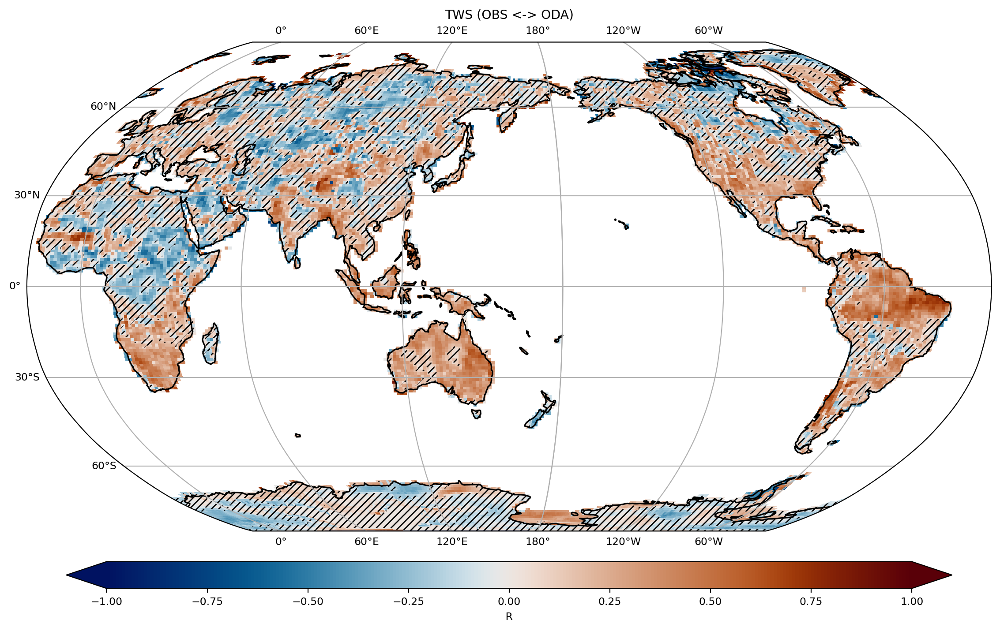

elasped time for figure: 28.350347995758057


In [84]:
# plot for ODA (TWS)

start_time = time.time()


varn=cfg_var_TWS.var #example

data_array=corr_ODA
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,  # 원래 데이터의 차원
    coords=data_array.coords,  # 원래 데이터의 좌표
)

data_array.attrs['name'] = cfg_var_TWS.var

projection = ccrs.Robinson(central_longitude=160)

plt.rcParams.update({'font.size': 8.5})
fig, ax2 = plt.subplots(1, 1, figsize=(18.5, 9), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection})

cbar_kwargs={'orientation':'horizontal','pad':0.05,'shrink':0.7, 'label':' R ', 'aspect':33, 'extend': 'both'}
if cfg_var_TWS.comp=='ocn' or cfg_var_TWS.comp=='ice':
    # plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=0.05, vmin=-0.05,cmap=cm.vik, cbar_kwargs=cbar_kwargs)
    plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, cbar_kwargs=cbar_kwargs)

else:
    plt1=data_array.plot.pcolormesh(ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1, cmap=cm.vik, cbar_kwargs=cbar_kwargs)
contour1 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax2, transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['////'], add_colorbar=False) # works very well



ax2.coastlines(resolution='110m', color='black', linewidth=1.2)

ax2.set_title(f'{varn} (OBS <-> ODA)')
ax2.gridlines(draw_labels=True) 

ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))

plt.show()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for figure: ' + str(elapsed_time))

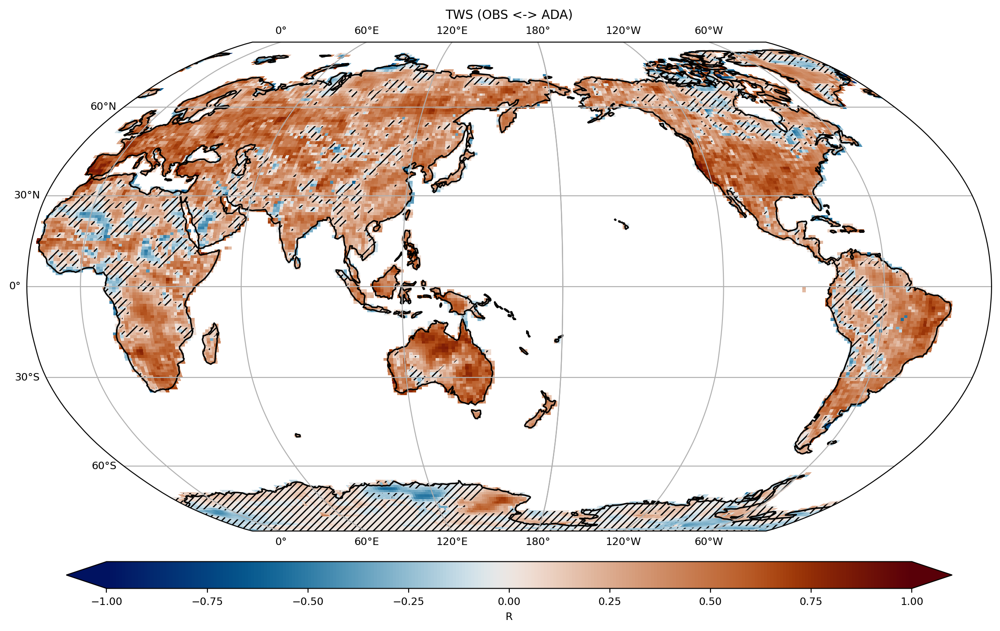

elasped time for figure: 29.99310851097107


In [85]:
# plot for ADA (TWS)

start_time = time.time()


varn=cfg_var_TWS.var #example

data_array=corr_ADA
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,  # 원래 데이터의 차원
    coords=data_array.coords,  # 원래 데이터의 좌표
)

data_array.attrs['name'] = cfg_var_TWS.var

projection = ccrs.Robinson(central_longitude=160)

plt.rcParams.update({'font.size': 8.5})
fig, ax2 = plt.subplots(1, 1, figsize=(18.5, 9), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection})

cbar_kwargs={'orientation':'horizontal','pad':0.05,'shrink':0.7, 'label':' R ', 'aspect':33, 'extend': 'both'}
if cfg_var_TWS.comp=='ocn' or cfg_var_TWS.comp=='ice':
    # plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=0.05, vmin=-0.05,cmap=cm.vik, cbar_kwargs=cbar_kwargs)
    plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, cbar_kwargs=cbar_kwargs)

else:
    plt1=data_array.plot.pcolormesh(ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1, cmap=cm.vik, cbar_kwargs=cbar_kwargs)
contour1 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax2, transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['////'], add_colorbar=False) # works very well



ax2.coastlines(resolution='110m', color='black', linewidth=1.2)

ax2.set_title(f'{varn} (OBS <-> ADA)')
ax2.gridlines(draw_labels=True) 

ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))

plt.show()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for figure: ' + str(elapsed_time))

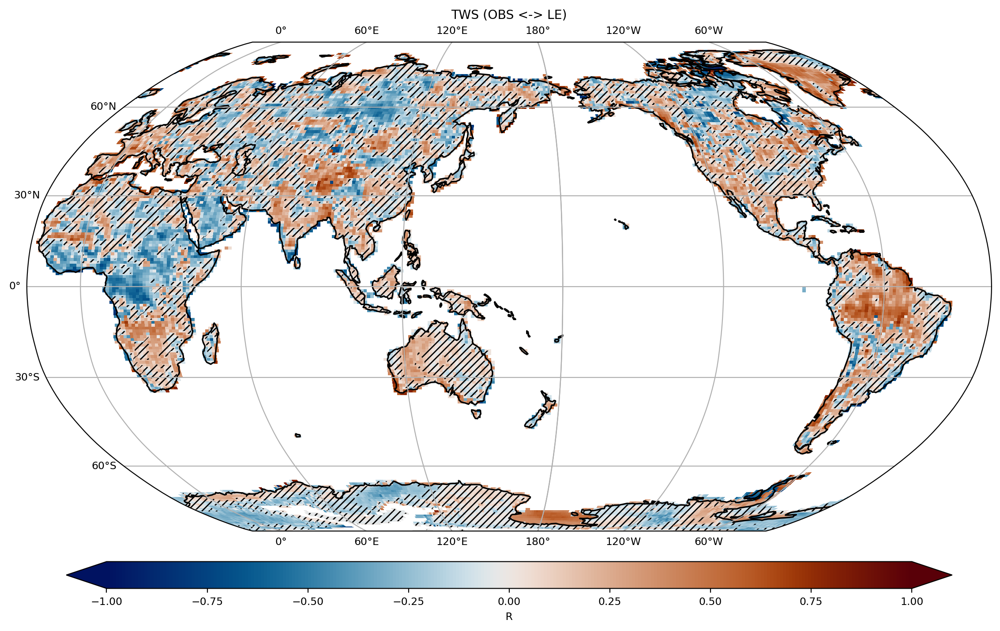

elasped time for figure: 123.54174184799194


In [86]:
# plot for LE (TWS)

start_time = time.time()


varn=cfg_var_TWS.var #example

data_array=corr_LE
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,  # 원래 데이터의 차원
    coords=data_array.coords,  # 원래 데이터의 좌표
)

data_array.attrs['name'] = cfg_var_TWS.var

projection = ccrs.Robinson(central_longitude=160)

plt.rcParams.update({'font.size': 8.5})
fig, ax2 = plt.subplots(1, 1, figsize=(18.5, 9), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection})

cbar_kwargs={'orientation':'horizontal','pad':0.05,'shrink':0.7, 'label':' R ', 'aspect':33, 'extend': 'both'}
if cfg_var_TWS.comp=='ocn' or cfg_var_TWS.comp=='ice':
    # plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=0.05, vmin=-0.05,cmap=cm.vik, cbar_kwargs=cbar_kwargs)
    plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, cbar_kwargs=cbar_kwargs)

else:
    plt1=data_array.plot.pcolormesh(ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1, cmap=cm.vik, cbar_kwargs=cbar_kwargs)
contour1 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax2, transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['////'], add_colorbar=False) # works very well



ax2.coastlines(resolution='110m', color='black', linewidth=1.2)

ax2.set_title(f'{varn} (OBS <-> LE)')
ax2.gridlines(draw_labels=True) 

ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))

plt.show()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for figure: ' + str(elapsed_time))

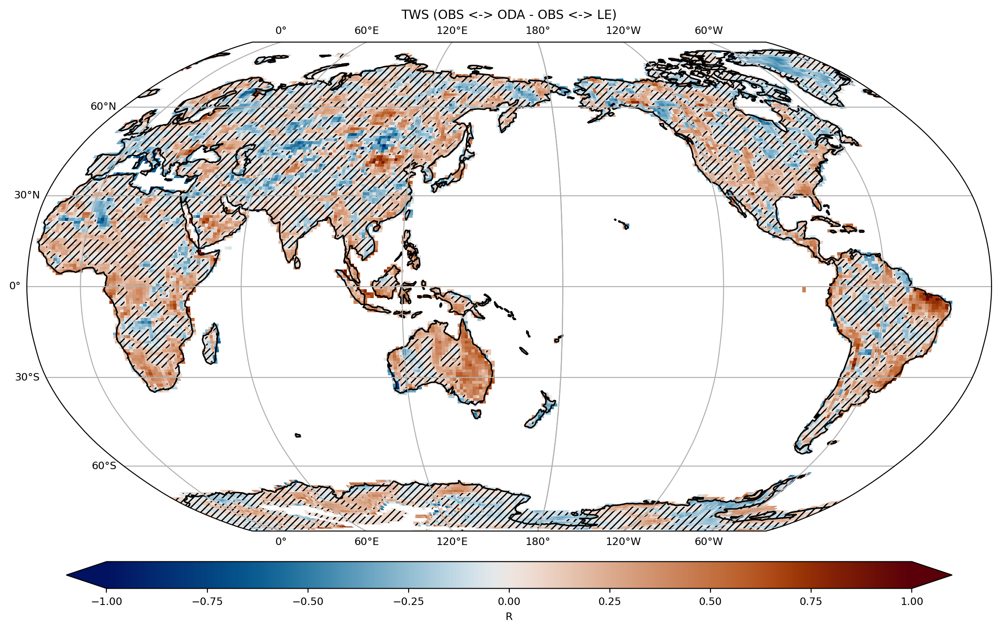

elasped time for figure: 145.03856778144836


In [87]:
# plot for ODA - LE (TWS)

start_time = time.time()


varn=cfg_var_TWS.var #example

data_array=corr_ODA - corr_LE
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,  # 원래 데이터의 차원
    coords=data_array.coords,  # 원래 데이터의 좌표
)

data_array.attrs['name'] = cfg_var_TWS.var

projection = ccrs.Robinson(central_longitude=160)

plt.rcParams.update({'font.size': 8.5})
fig, ax2 = plt.subplots(1, 1, figsize=(18.5, 9), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection})

cbar_kwargs={'orientation':'horizontal','pad':0.05,'shrink':0.7, 'label':' R ', 'aspect':33, 'extend': 'both'}
if cfg_var_TWS.comp=='ocn' or cfg_var_TWS.comp=='ice':
    # plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=0.05, vmin=-0.05,cmap=cm.vik, cbar_kwargs=cbar_kwargs)
    plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, cbar_kwargs=cbar_kwargs)

else:
    plt1=data_array.plot.pcolormesh(ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1, cmap=cm.vik, cbar_kwargs=cbar_kwargs)
contour1 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax2, transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['////'], add_colorbar=False) # works very well



ax2.coastlines(resolution='110m', color='black', linewidth=1.2)

ax2.set_title(f'{varn} (OBS <-> ODA - OBS <-> LE)')
ax2.gridlines(draw_labels=True) 

ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))

plt.show()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for figure: ' + str(elapsed_time))

In [89]:
cfg_var_PSL=CESM2_config()
cfg_var_PSL.year_s=1960
cfg_var_PSL.year_e=2020
cfg_var_PSL.setvar('PSL')
# cfg_var_PSL.list()

cfg_var_U=CESM2_config()
cfg_var_U.year_s=1960
cfg_var_U.year_e=2020
cfg_var_U.setvar('U')
# cfg_var_U.list()

cfg_var_V=CESM2_config()
cfg_var_V.year_s=1960
cfg_var_V.year_e=2020
cfg_var_V.setvar('V')
# cfg_var_V.list()

{'codebase': 'e21',
 'comp': 'atm',
 'compset': 'b',
 'dimension': 'time '
              'lat '
              'lon',
 'long_name': 'Sea '
              'level '
              'pressure',
 'model': 'cam.h0',
 'ndim': 3,
 'resol': 'f09_g17',
 'tfreq': 'month_1',
 'unit': 'Pa',
 'var': 'PSL',
 'year_e': 2020,
 'year_s': 1960}
{'codebase': 'e21',
 'comp': 'atm',
 'compset': 'b',
 'dimension': 'time '
              'lev '
              'lat '
              'lon',
 'long_name': 'Zonal '
              'wind',
 'model': 'cam.h0',
 'ndim': 4,
 'resol': 'f09_g17',
 'tfreq': 'month_1',
 'unit': 'm/s',
 'var': 'U',
 'year_e': 2020,
 'year_s': 1960}
{'codebase': 'e21',
 'comp': 'atm',
 'compset': 'b',
 'dimension': 'time '
              'lev '
              'lat '
              'lon',
 'long_name': 'Meridional '
              'wind',
 'model': 'cam.h0',
 'ndim': 4,
 'resol': 'f09_g17',
 'tfreq': 'month_1',
 'unit': 'm/s',
 'var': 'V',
 'year_e': 2020,
 'year_s': 1960}


In [111]:
# # Read LE dataset (U)
# start_time = time.time()


# cfg_var_U.LE_path_load(cfg_var_U.var)
# cfg_var_U.LE_ds = xr.open_mfdataset(cfg_var_U.LE_file_list[0], 
#                        chunks={'time': 2}, 
#                        combine='nested', 
#                        concat_dim=[[*cfg_var_U.LE_ensembles], 'time'], 
#                        parallel=True,
#                        preprocess=lambda ds: process_coords_atm_surface(ds, start_date, end_date, 'lnd'),
#                        decode_cf=True, 
#                        decode_times=True)      


# cfg_var_U.LE_ds = cfg_var_U.LE_ds.rename({"concat_dim": "ens_LE"})
# new_time = cfg_var_U.LE_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var_U.LE_ds.time))
# cfg_var_U.LE_ds = cfg_var_U.LE_ds.assign_coords(time=new_time)
# cfg_var_U.LE_ds = cfg_var_U.LE_ds.compute()

# end_time = time.time()
# elapsed_time = end_time - start_time
# print('elasped time for reading LE: ' + str(elapsed_time))



# Read ODA dataset (projd only) 
start_time = time.time()

cfg_var_U.ODA_path_load(cfg_var_U.var)

cfg_var_U.ODA_ds = xr.open_mfdataset(cfg_var_U.ODA_file_list[0][10:20], 
                           chunks={'time': 2}, 
                           combine='nested', 
                           concat_dim=[[*cfg_var_U.ODA_ensembles[10:20]], 'time'], 
                           parallel=True,
                           preprocess=lambda ds: process_coords_atm_surface(ds, start_date, end_date, 'lnd'),
                           decode_cf=True, 
                           decode_times=True)

cfg_var_U.ODA_ds = cfg_var_U.ODA_ds.rename({"concat_dim": "ens_ODA"})
new_time = cfg_var_U.ODA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var_U.ODA_ds.time))
cfg_var_U.ODA_ds = cfg_var_U.ODA_ds.assign_coords(time=new_time)
cfg_var_U.ODA_ds = cfg_var_U.ODA_ds.compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading ODA: ' + str(elapsed_time))


# #Read ADA dataset
# start_time = time.time()

# cfg_var_U.ADA_path_load(cfg_var_U.var)
# cfg_var_U.ADA_ds = xr.open_mfdataset(cfg_var_U.ADA_file_list[0], 
#                        chunks={'time': 2}, 
#                        combine='nested',
#                        concat_dim=[[*cfg_var_U.ADA_ensembles], 'time'], 
#                        parallel=True,
#                        preprocess=lambda ds: process_coords_atm_surface(ds, start_date, end_date, 'lnd'),
#                        decode_cf=True, 
#                        decode_times=True)      


# cfg_var_U.ADA_ds = cfg_var_U.ADA_ds.rename({"concat_dim": "ens_ADA"})
# new_time = cfg_var_U.ADA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var_U.ADA_ds.time))
# cfg_var_U.ADA_ds = cfg_var_U.ADA_ds.assign_coords(time=new_time)
# cfg_var_U.ADA_ds = cfg_var_U.ADA_ds.compute()

# end_time = time.time()
# elapsed_time = end_time - start_time
# print('elasped time for reading ADA: ' + str(elapsed_time))


# Read OBS dataset (U)
start_time = time.time()

cfg_var_U.OBS_path_load(cfg_var_U.var)
# cfg_var_U.OBS_file_list[0]
tmp_comp=cfg_var_U.comp
cfg_var_U.OBS_ds = []
cfg_var_U.OBS_ds = xr.open_mfdataset(cfg_var_U.OBS_file_list[0][0],
                       preprocess=lambda ds: process_coords_obs_atm(ds, start_date, end_date, 'lnd'))

cfg_var_U.OBS_ds = cfg_var_U.OBS_ds.rename({cfg_var_U.OBS_var: cfg_var_U.var})



cfg_var_U.OBS_ds=cfg_var_U.OBS_ds.compute()
# cfg_var_U.OBS_ds = cfg_var_U.OBS_ds.rename({'T': 'time'})
cfg_var_U.OBS_ds=cfg_var_U.OBS_ds.assign_coords(time=cfg_var_U.ODA_ds.time)

cfg_var_U.OBS_ds['lat'] = cfg_var_U.ODA_ds['lat']
cfg_var_U.OBS_ds['lon'] = cfg_var_U.ODA_ds['lon']
cfg_var_U.OBS_ds = cfg_var_U.OBS_ds.compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading OBS, ' + ': ' + str(elapsed_time))

elasped time for reading ODA: 65.71967887878418
elasped time for reading OBS, : 6.078249454498291


In [112]:
# U Postprocessing

# obs_non_nan_times = cfg_var.OBS_ds.notnull()
# ada_filtered = cfg_var.ADA_ds.sel(time=obs_non_nan_times)

# Step 1: OBS_ds에서 NaN이 아닌 시간대에 해당하는 boolean mask 생성
obs_non_nan_times = cfg_var_U.OBS_ds[cfg_var_U.var].notnull().any(dim=['lat', 'lon'])
# Step 2: boolean mask를 명시적으로 계산 (compute() 호출)
obs_non_nan_times = obs_non_nan_times.compute()
# Step 3: NaN이 아닌 시간대에 해당하는 time 좌표 추출
non_nan_time_coords = cfg_var_U.OBS_ds.time.where(obs_non_nan_times, drop=True)
# Step 4: ADA_ds에서 NaN이 아닌 시간대에 해당하는 자료만 선택
cfg_var_U.ODA_ds_filtered = cfg_var_U.ODA_ds.sel(time=non_nan_time_coords)
cfg_var_U.LE_ds_filtered = cfg_var_U.LE_ds.sel(time=non_nan_time_coords)
cfg_var_U.ADA_ds_filtered = cfg_var_U.ADA_ds.sel(time=non_nan_time_coords)

# # Step 5: 연도별로 그룹화하고 NaN을 무시한 연평균 계산
# cfg_var_U.ADA_ds_an = cfg_var_U.ADA_ds_filtered.groupby('time.year').mean(dim='time', skipna=True)
cfg_var_U.ODA_ds_an = cfg_var_U.ODA_ds_filtered.groupby('time.year').mean(dim='time', skipna=True)
# cfg_var_U.LE_ds_an = cfg_var_U.LE_ds_filtered.groupby('time.year').mean(dim='time', skipna=True)
cfg_var_U.OBS_ds_an = cfg_var_U.OBS_ds.groupby('time.year').mean(dim='time', skipna=True)


#ensemble mean
# cfg_var_U.ADA_ds_an_enm=cfg_var_U.ADA_ds_an[cfg_var_U.var].mean(dim='ens_ADA')
cfg_var_U.ODA_ds_an_enm=cfg_var_U.ODA_ds_an[cfg_var_U.var].mean(dim='ens_ODA')
# cfg_var_U.LE_ds_an_enm=cfg_var_U.LE_ds_an[cfg_var_U.var].mean(dim='ens_LE')

#corr
# corr_ADA_U = xr.corr(cfg_var_U.ADA_ds_an_enm, getattr(cfg_var_U.OBS_ds_an,cfg_var_U.var), dim='year')
corr_ODA_U = xr.corr(cfg_var_U.ODA_ds_an_enm, getattr(cfg_var_U.OBS_ds_an,cfg_var_U.var), dim='year')
# corr_LE_U = xr.corr(cfg_var_U.LE_ds_an_enm, getattr(cfg_var_U.OBS_ds_an,cfg_var_U.var), dim='year')



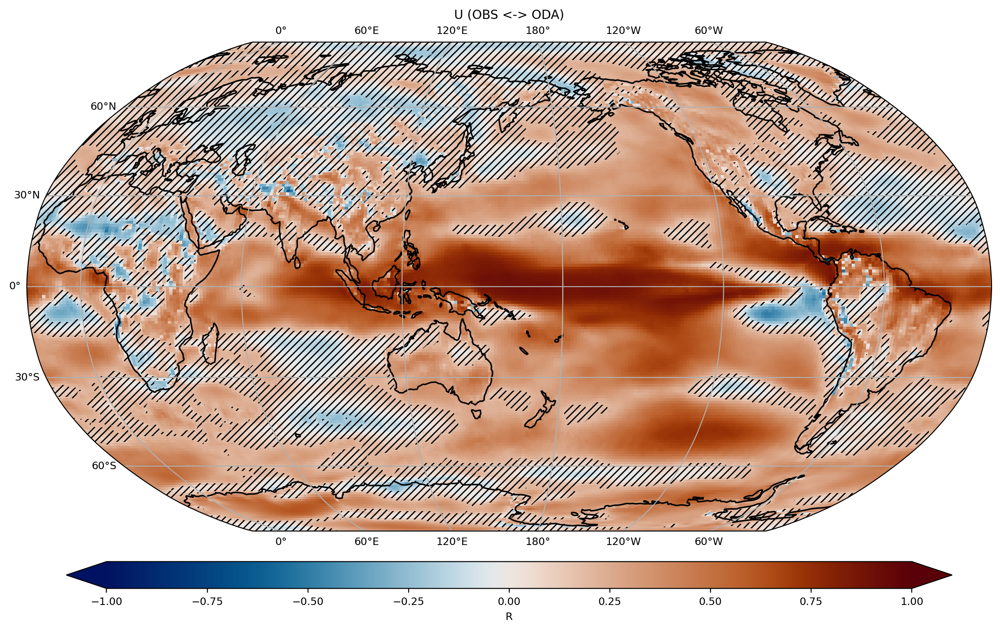

elasped time for figure: 7.357715845108032


In [113]:
# plot for ODA (U)

start_time = time.time()


varn=cfg_var_U.var #example

data_array=corr_ODA_U
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,  # 원래 데이터의 차원
    coords=data_array.coords,  # 원래 데이터의 좌표
)

data_array.attrs['name'] = cfg_var_U.var

projection = ccrs.Robinson(central_longitude=160)

plt.rcParams.update({'font.size': 8.5})
fig, ax2 = plt.subplots(1, 1, figsize=(18.5, 9), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection})

cbar_kwargs={'orientation':'horizontal','pad':0.05,'shrink':0.7, 'label':' R ', 'aspect':33, 'extend': 'both'}
if cfg_var_U.comp=='ocn' or cfg_var_U.comp=='ice':
    # plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=0.05, vmin=-0.05,cmap=cm.vik, cbar_kwargs=cbar_kwargs)
    plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, cbar_kwargs=cbar_kwargs)

else:
    plt1=data_array.plot.pcolormesh(ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1, cmap=cm.vik, cbar_kwargs=cbar_kwargs)
contour1 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax2, transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['////'], add_colorbar=False) # works very well



ax2.coastlines(resolution='110m', color='black', linewidth=1.2)

ax2.set_title(f'{varn} (OBS <-> ODA)')
ax2.gridlines(draw_labels=True) 

ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))

plt.show()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for figure: ' + str(elapsed_time))

In [114]:
# Read ODA dataset (projd only)  V
start_time = time.time()

cfg_var_V.ODA_path_load(cfg_var_V.var)

cfg_var_V.ODA_ds = xr.open_mfdataset(cfg_var_V.ODA_file_list[0][10:20], 
                           chunks={'time': 2}, 
                           combine='nested', 
                           concat_dim=[[*cfg_var_V.ODA_ensembles[10:20]], 'time'], 
                           parallel=True,
                           preprocess=lambda ds: process_coords_atm_surface(ds, start_date, end_date, 'lnd'),
                           decode_cf=True, 
                           decode_times=True)

cfg_var_V.ODA_ds = cfg_var_V.ODA_ds.rename({"concat_dim": "ens_ODA"})
new_time = cfg_var_V.ODA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var_V.ODA_ds.time))
cfg_var_V.ODA_ds = cfg_var_V.ODA_ds.assign_coords(time=new_time)
cfg_var_V.ODA_ds = cfg_var_V.ODA_ds.compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading ODA: ' + str(elapsed_time))


# Read OBS dataset (V)
start_time = time.time()

cfg_var_V.OBS_path_load(cfg_var_V.var)
# cfg_var_V.OBS_file_list[0]
tmp_comp=cfg_var_V.comp
cfg_var_V.OBS_ds = []
cfg_var_V.OBS_ds = xr.open_mfdataset(cfg_var_V.OBS_file_list[0][0],
                       preprocess=lambda ds: process_coords_obs_atm(ds, start_date, end_date, 'lnd'))

cfg_var_V.OBS_ds = cfg_var_V.OBS_ds.rename({cfg_var_V.OBS_var: cfg_var_V.var})



cfg_var_V.OBS_ds=cfg_var_V.OBS_ds.compute()
# cfg_var_V.OBS_ds = cfg_var_V.OBS_ds.rename({'T': 'time'})
cfg_var_V.OBS_ds=cfg_var_V.OBS_ds.assign_coords(time=cfg_var_V.ODA_ds.time)

cfg_var_V.OBS_ds['lat'] = cfg_var_V.ODA_ds['lat']
cfg_var_V.OBS_ds['lon'] = cfg_var_V.ODA_ds['lon']
cfg_var_V.OBS_ds = cfg_var_V.OBS_ds.compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading OBS, ' + ': ' + str(elapsed_time))

elasped time for reading ODA: 179.99778199195862
elasped time for reading OBS, : 32.69234299659729


In [117]:
# V Postprocessing

# obs_non_nan_times = cfg_var.OBS_ds.notnull()
# ada_filtered = cfg_var.ADA_ds.sel(time=obs_non_nan_times)

# Step 1: OBS_ds에서 NaN이 아닌 시간대에 해당하는 boolean mask 생성
obs_non_nan_times = cfg_var_V.OBS_ds[cfg_var_V.var].notnull().any(dim=['lat', 'lon'])
# Step 2: boolean mask를 명시적으로 계산 (compute() 호출)
obs_non_nan_times = obs_non_nan_times.compute()
# Step 3: NaN이 아닌 시간대에 해당하는 time 좌표 추출
non_nan_time_coords = cfg_var_V.OBS_ds.time.where(obs_non_nan_times, drop=True)
# Step 4: ADA_ds에서 NaN이 아닌 시간대에 해당하는 자료만 선택
cfg_var_V.ODA_ds_filtered = cfg_var_V.ODA_ds.sel(time=non_nan_time_coords)

# # Step 5: 연도별로 그룹화하고 NaN을 무시한 연평균 계산
cfg_var_V.ODA_ds_an = cfg_var_V.ODA_ds_filtered.groupby('time.year').mean(dim='time', skipna=True)
cfg_var_V.OBS_ds_an = cfg_var_V.OBS_ds.groupby('time.year').mean(dim='time', skipna=True)


#ensemble mean
cfg_var_V.ODA_ds_an_enm=cfg_var_V.ODA_ds_an[cfg_var_V.var].mean(dim='ens_ODA')

#corr
corr_ODA_V = xr.corr(cfg_var_V.ODA_ds_an_enm, getattr(cfg_var_V.OBS_ds_an,cfg_var_V.var), dim='year')



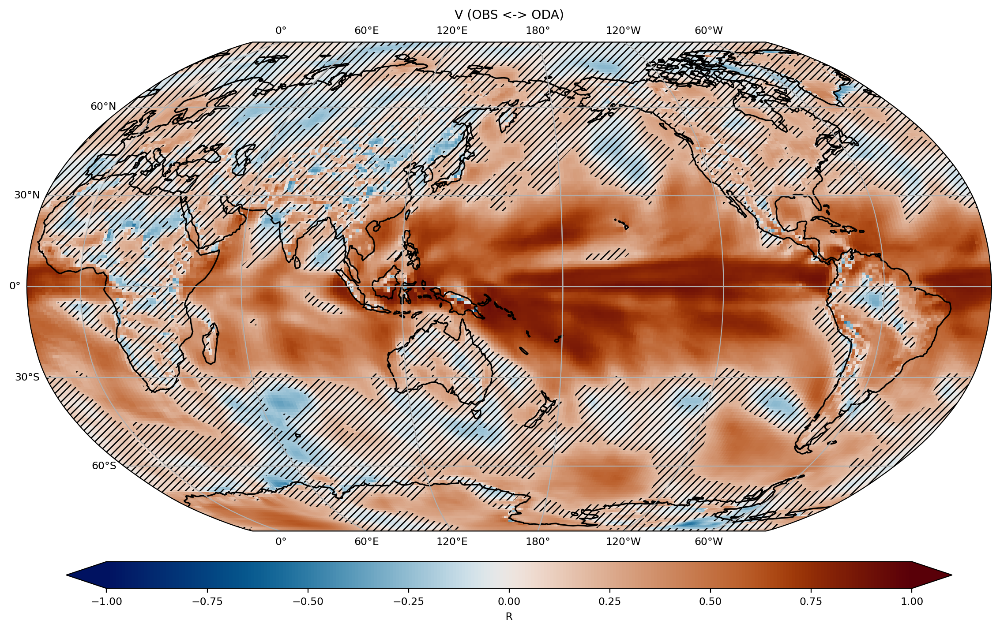

elasped time for figure: 5.326978445053101


In [118]:
# V correlation

# plot for ODA (V)

start_time = time.time()


varn=cfg_var_V.var #example

data_array=corr_ODA_V
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,  # 원래 데이터의 차원
    coords=data_array.coords,  # 원래 데이터의 좌표
)

data_array.attrs['name'] = cfg_var_V.var

projection = ccrs.Robinson(central_longitude=160)

plt.rcParams.update({'font.size': 8.5})
fig, ax2 = plt.subplots(1, 1, figsize=(18.5, 9), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection})

cbar_kwargs={'orientation':'horizontal','pad':0.05,'shrink':0.7, 'label':' R ', 'aspect':33, 'extend': 'both'}
if cfg_var_V.comp=='ocn' or cfg_var_V.comp=='ice':
    # plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=0.05, vmin=-0.05,cmap=cm.vik, cbar_kwargs=cbar_kwargs)
    plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, cbar_kwargs=cbar_kwargs)

else:
    plt1=data_array.plot.pcolormesh(ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1, cmap=cm.vik, cbar_kwargs=cbar_kwargs)
contour1 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax2, transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['////'], add_colorbar=False) # works very well



ax2.coastlines(resolution='110m', color='black', linewidth=1.2)

ax2.set_title(f'{varn} (OBS <-> ODA)')
ax2.gridlines(draw_labels=True) 

ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))

plt.show()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for figure: ' + str(elapsed_time))

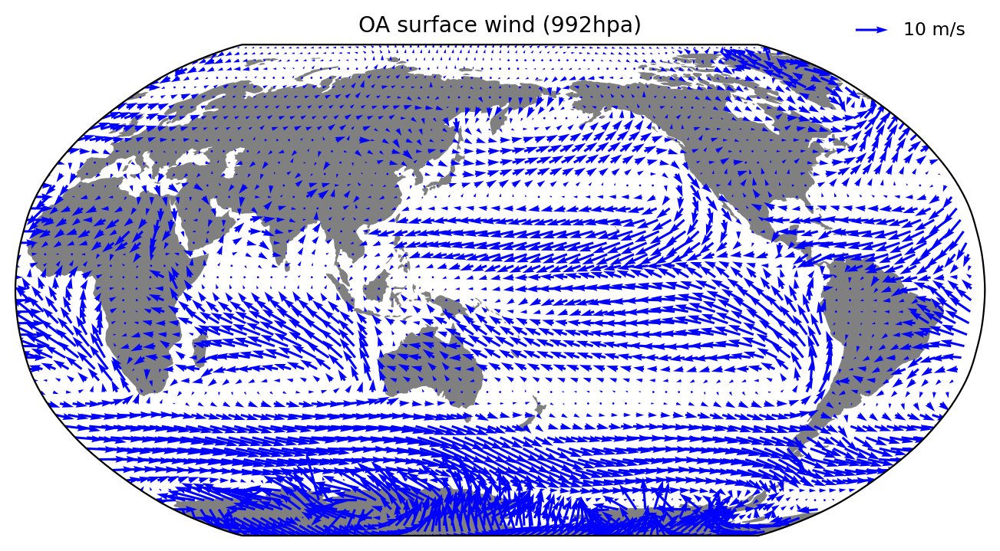

In [131]:
# ODA surface wind

import cartopy.feature as cfeature
land_feature = cfeature.LAND.with_scale('110m')

# wind vectors

projection = ccrs.Robinson(central_longitude=160)
fig, axes = plt.subplots(nrows=1, ncols=1, 
             dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection}, constrained_layout=True)

cmap2 = cmocean.cm.matter


# data_array = np.abs(corr_photoC_u_anom_clim_raw)
# plt1=data_array.where(mask_ODA_rgd, np.nan).plot.pcolormesh(x='lon', y='lat', ax=axes, transform=ccrs.PlateCarree(), 
#                                  cmap= cmap2, add_colorbar=True, vmin=0, vmax=1,
#                                 cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes.set_title('OA surface wind (992hpa)')
axes.add_feature(land_feature, facecolor='gray', edgecolor='none')


lat = cfg_var_U.ODA_ds['lat'].values
lon = cfg_var_V.ODA_ds['lon'].values
lon2d, lat2d = np.meshgrid(lon, lat)

U = cfg_var_U.ODA_ds_an_enm.mean(dim='year')  # shape (lat, lon)
V = cfg_var_V.ODA_ds_an_enm.mean(dim='year')  # shape (lat, lon)

aval=1
qvint = 4

q = axes.quiver(
    lon2d[::qvint, ::qvint], lat2d[::qvint, ::qvint], U.values[::qvint, ::qvint], V.values[::qvint, ::qvint],
    transform=ccrs.PlateCarree(),
    scale=300,       # adjust to control arrow size. large scale = small arrow
    color='blue',      # or use 'C0' or a colormap
    alpha=aval
)

axes.quiverkey(q, 0.9, 1.03, 10, '10 m/s', labelpos='E', alpha=aval)


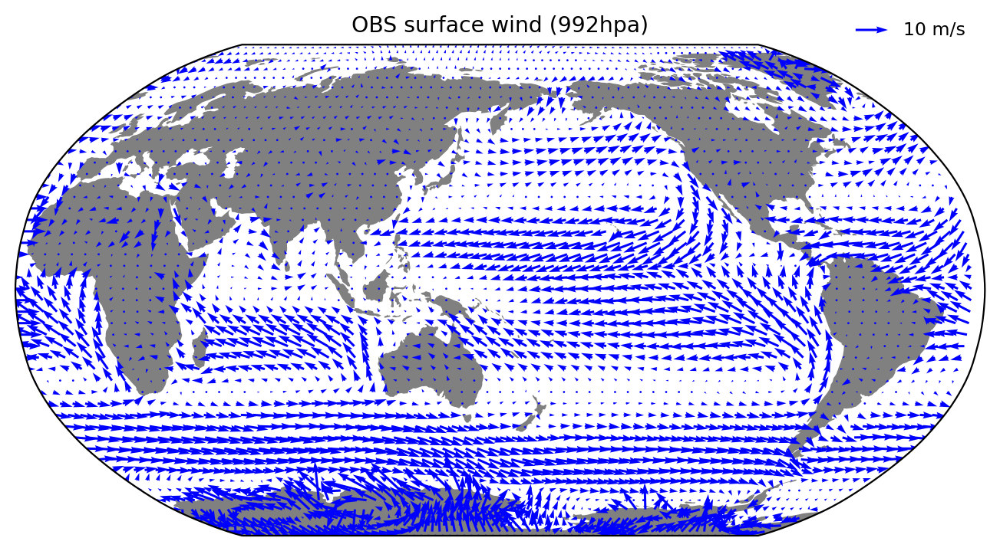

In [138]:
# OBS surface wind

import cartopy.feature as cfeature
land_feature = cfeature.LAND.with_scale('110m')

# wind vectors

projection = ccrs.Robinson(central_longitude=160)
fig, axes = plt.subplots(nrows=1, ncols=1, 
             dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection}, constrained_layout=True)

cmap2 = cmocean.cm.matter

axes.set_title('OBS surface wind (992hpa)')
axes.add_feature(land_feature, facecolor='gray', edgecolor='none')


lat = cfg_var_U.OBS_ds['lat'].values
lon = cfg_var_V.OBS_ds['lon'].values
lon2d, lat2d = np.meshgrid(lon, lat)

U = cfg_var_U.OBS_ds_an.mean(dim='year')  # shape (lat, lon)
V = cfg_var_V.OBS_ds_an.mean(dim='year')  # shape (lat, lon)

aval=1
qvint = 4

q = axes.quiver(
    lon2d[::qvint, ::qvint], lat2d[::qvint, ::qvint], U.U.values[::qvint, ::qvint], V.V.values[::qvint, ::qvint],
    transform=ccrs.PlateCarree(),
    scale=300,       # adjust to control arrow size. large scale = small arrow
    color='blue',      # or use 'C0' or a colormap
    alpha=aval
)

axes.quiverkey(q, 0.9, 1.03, 10, '10 m/s', labelpos='E', alpha=aval)


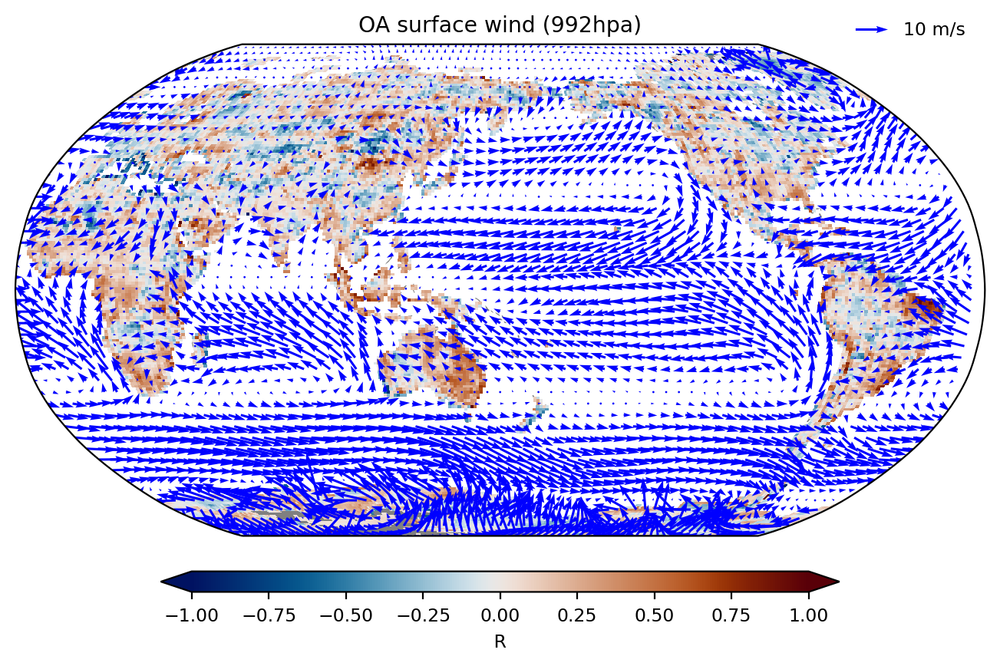

In [143]:
# TWS corr and ODA surface wind

import cartopy.feature as cfeature
land_feature = cfeature.LAND.with_scale('110m')




# wind vectors

projection = ccrs.Robinson(central_longitude=160)
fig, axes = plt.subplots(nrows=1, ncols=1, 
             dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection}, constrained_layout=True)



cbar_kwargs={'orientation':'horizontal','pad':0.05,'shrink':0.7, 'label':' R ', 'aspect':33, 'extend': 'both'}

data_array = corr_ODA_TWS - corr_LE_TWS
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes, transform=ccrs.PlateCarree(), 
                                 cmap= cm.vik, add_colorbar=True, vmin=-1, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional', 
                                             'orientation':'horizontal','pad':0.05,'shrink':0.7, 'label':' R ', 'aspect':33, 'extend': 'both'})

axes.set_title('OA surface wind (992hpa)')
axes.add_feature(land_feature, facecolor='gray', edgecolor='none')


lat = cfg_var_U.ODA_ds['lat'].values
lon = cfg_var_V.ODA_ds['lon'].values
lon2d, lat2d = np.meshgrid(lon, lat)

U = cfg_var_U.ODA_ds_an_enm.mean(dim='year')  # shape (lat, lon)
V = cfg_var_V.ODA_ds_an_enm.mean(dim='year')  # shape (lat, lon)

aval=1
qvint = 4

q = axes.quiver(
    lon2d[::qvint, ::qvint], lat2d[::qvint, ::qvint], U.values[::qvint, ::qvint], V.values[::qvint, ::qvint],
    transform=ccrs.PlateCarree(),
    scale=300,       # adjust to control arrow size. large scale = small arrow
    color='blue',      # or use 'C0' or a colormap
    alpha=aval
)

axes.quiverkey(q, 0.9, 1.03, 10, '10 m/s', labelpos='E', alpha=aval)


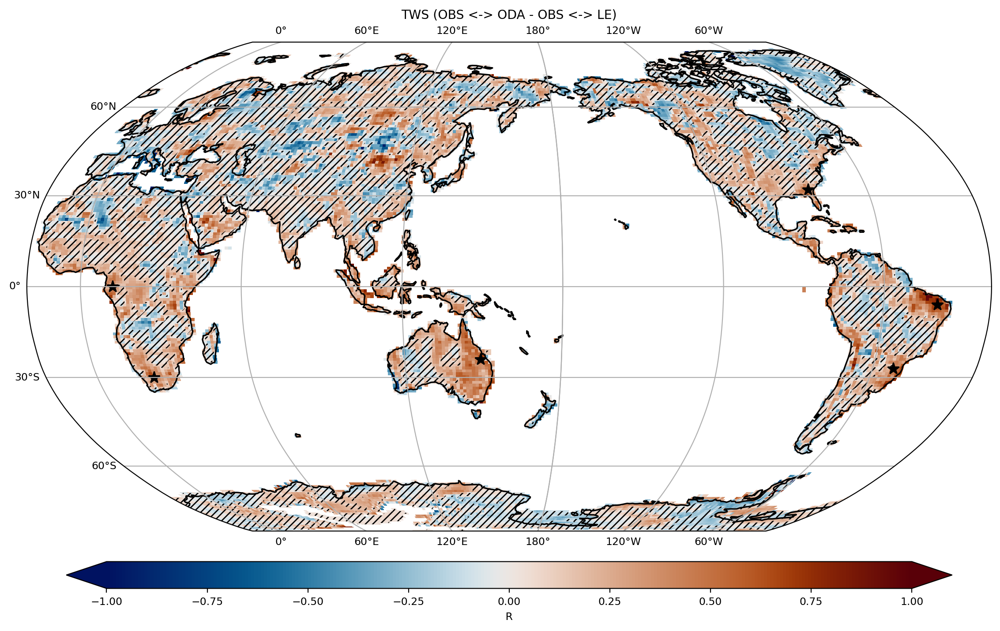

elasped time for figure: 5.56058144569397


In [289]:
# plot for ODA - LE (TWS) with stations

start_time = time.time()


varn=cfg_var_TWS.var #example

data_array=corr_ODA_TWS - corr_LE_TWS
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,  # 원래 데이터의 차원
    coords=data_array.coords,  # 원래 데이터의 좌표
)

data_array.attrs['name'] = cfg_var_TWS.var

projection = ccrs.Robinson(central_longitude=160)

plt.rcParams.update({'font.size': 8.5})
fig, ax2 = plt.subplots(1, 1, figsize=(18.5, 9), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection})

cbar_kwargs={'orientation':'horizontal','pad':0.05,'shrink':0.7, 'label':' R ', 'aspect':33, 'extend': 'both'}
if cfg_var_TWS.comp=='ocn' or cfg_var_TWS.comp=='ice':
    # plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=0.05, vmin=-0.05,cmap=cm.vik, cbar_kwargs=cbar_kwargs)
    plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, cbar_kwargs=cbar_kwargs)

else:
    plt1=data_array.plot.pcolormesh(ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1, cmap=cm.vik, cbar_kwargs=cbar_kwargs)
contour1 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax2, transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['////'], add_colorbar=False) # works very well



ax2.coastlines(resolution='110m', color='black', linewidth=1.2)

ax2.set_title(f'{varn} (OBS <-> ODA - OBS <-> LE)')
ax2.gridlines(draw_labels=True) 

ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))



# Example coordinates (latitude, longitude)
latitudes = [32, -6, -27, -30, 0, -24]
longitudes = [277, 320, 308, 22, 12, 149]

# Plot stars at specified lat/lon points on the map
ax2.plot(longitudes, latitudes,
         marker='*', markersize=10,  # star marker size
         color='black',
         linestyle='None',          # no connecting lines
         transform=ccrs.PlateCarree(),  # coordinate system is in degrees (lon/lat)
         label='Target Points')         # optional label for legend

plt.show()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for figure: ' + str(elapsed_time))

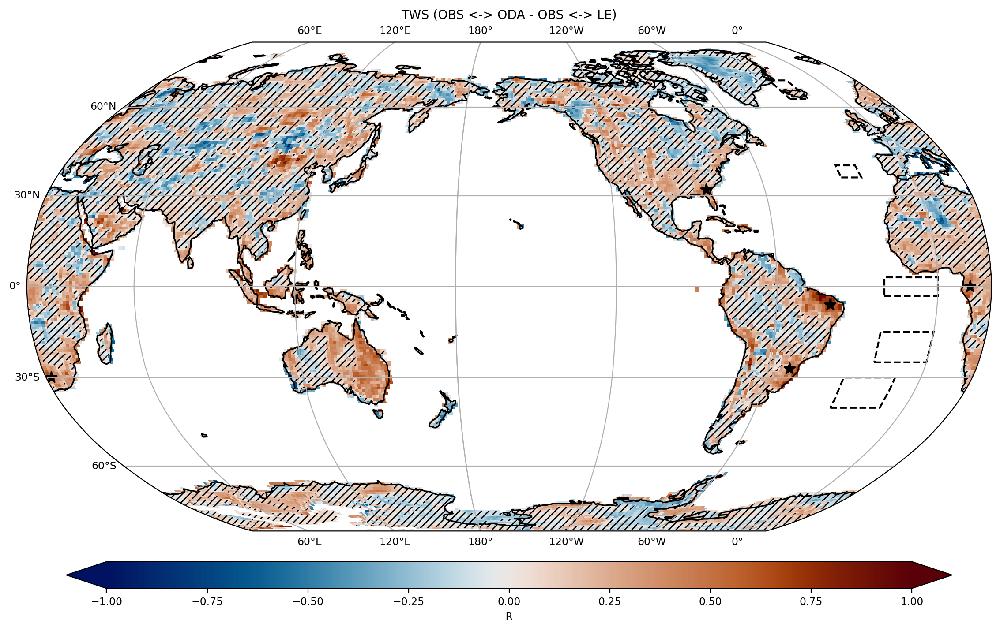

elasped time for figure: 5.708307504653931


In [255]:
# plot with stations, boxes

from matplotlib.patches import Rectangle




start_time = time.time()


varn=cfg_var_TWS.var #example

data_array=corr_ODA_TWS - corr_LE_TWS
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,  # 원래 데이터의 차원
    coords=data_array.coords,  # 원래 데이터의 좌표
)

data_array.attrs['name'] = cfg_var_TWS.var

projection = ccrs.Robinson(central_longitude=200)

plt.rcParams.update({'font.size': 8.5})
fig, ax2 = plt.subplots(1, 1, figsize=(18.5, 9), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection})

cbar_kwargs={'orientation':'horizontal','pad':0.05,'shrink':0.7, 'label':' R ', 'aspect':33, 'extend': 'both'}
if cfg_var_TWS.comp=='ocn' or cfg_var_TWS.comp=='ice':
    # plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=0.05, vmin=-0.05,cmap=cm.vik, cbar_kwargs=cbar_kwargs)
    plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, cbar_kwargs=cbar_kwargs)

else:
    plt1=data_array.plot.pcolormesh(ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1, cmap=cm.vik, cbar_kwargs=cbar_kwargs)
contour1 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax2, transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['////'], add_colorbar=False) # works very well



ax2.coastlines(resolution='110m', color='black', linewidth=1.2)

ax2.set_title(f'{varn} (OBS <-> ODA - OBS <-> LE)')
ax2.gridlines(draw_labels=True) 

ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))



# Example coordinates (latitude, longitude)
latitudes = [32, -6, -27, -30, 0]
longitudes = [277, 320, 308, 22, 12]

# Plot stars at specified lat/lon points on the map
ax2.plot(longitudes, latitudes,
         marker='*', markersize=10,  # star marker size
         color='black',
         linestyle='None',          # no connecting lines
         transform=ccrs.PlateCarree(),  # coordinate system is in degrees (lon/lat)
         label='Target Points')         # optional label for legend




def add_box(ax, box, color='blue', label=None):
    rect = Rectangle(
        (box['lon_min'], box['lat_min']),
        box['lon_max'] - box['lon_min'],
        box['lat_max'] - box['lat_min'],
        linewidth=1.5,
        edgecolor=color,
        facecolor='none',
        linestyle='--',
        transform=ccrs.PlateCarree(),
        label=label
    )
    ax.add_patch(rect)

# 정의
atl3_box = dict(lon_min=340, lon_max=360, lat_min=-3, lat_max=3)
# sat_box  = dict(lon_min=345, lon_max=365, lat_min=-20, lat_max=-5)
# tsa_box  = dict(lon_min=330, lon_max=370, lat_min=-20, lat_max=0)
# tna_box  = dict(lon_min=305, lon_max=345, lat_min=5, lat_max=25)
sasd_sp_box  = dict(lon_min=330, lon_max=350, lat_min=-40, lat_max=-30)
sasd_np_box  = dict(lon_min=340, lon_max=360, lat_min=-25, lat_max=-15)
nao_az_box  = dict(lon_min=332, lon_max=340, lat_min=36, lat_max=40)
nao_ic_box  = dict(lon_min=335, lon_max=344, lat_min=63, lat_max=70)

# sasd_sp = sst.sel(lon=slice(330, 350), lat=slice(-40, -30)).mean(dim=['lat', 'lon'], skipna=True)
# sasd_np = sst.sel(lon=slice(340, 360), lat=slice(-25, -15)).mean(dim=['lat', 'lon'], skipna=True)
# nao_sp = PSL.sel(lon=slice(332, 340), lat=slice(36, 40)).mean(dim=['lat', 'lon'], skipna=True)
# nao_np = PSL.sel(lon=slice(335, 344), lat=slice(63, 70)).mean(dim=['lat', 'lon'], skipna=True)

# 추가
add_box(ax2, atl3_box, color='black', label='ATL3')
# add_box(ax2, sat_box, color='black', label='SAT')
# add_box(ax2, tsa_box, color='black', label='TSA')
# add_box(ax2, tna_box, color='black', label='TNA')
add_box(ax2, sasd_sp_box, color='black', label='SASD_SP')
add_box(ax2, sasd_np_box, color='black', label='SASD_NP')
add_box(ax2, nao_az_box, color='black', label='NAO_AZ')
add_box(ax2, nao_ic_box, color='black', label='NAO_IC')

# Eq-20°S and 10°E-30°W. 

plt.show()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for figure: ' + str(elapsed_time))


In [182]:
# SST processing

cfg_var_SST=CESM2_config()
cfg_var_SST.year_s=1960
cfg_var_SST.year_e=2020
cfg_var_SST.setvar('SST')

# Read ODA dataset (projd only)
start_time = time.time()

#SST
cfg_var_SST.ODA_path_load(cfg_var_SST.var)

cfg_var_SST.ODA_ds = xr.open_mfdataset(cfg_var_SST.ODA_file_list[0][10:20], 
                           chunks={'time': 2}, 
                           combine='nested', 
                           concat_dim=[[*cfg_var_SST.ODA_ensembles[10:20]], 'time'], 
                           parallel=True,
                           preprocess=lambda ds: process_coords(ds, start_date, end_date, 'lnd'),
                           decode_cf=True, 
                           decode_times=True)

cfg_var_SST.ODA_ds = cfg_var_SST.ODA_ds.rename({"concat_dim": "ens_ODA"})
new_time = cfg_var_SST.ODA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var_SST.ODA_ds.time))
cfg_var_SST.ODA_ds = cfg_var_SST.ODA_ds.assign_coords(time=new_time)
cfg_var_SST.ODA_ds=cfg_var_SST.ODA_ds.compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading ODA: ' + str(elapsed_time))


cfg_var_SST.ODA_ds_filtered = cfg_var_SST.ODA_ds
cfg_var_SST.ODA_ds_an = cfg_var_SST.ODA_ds_filtered.groupby('time.year').mean(dim='time', skipna=True).compute()
cfg_var_SST.ODA_ds_an_enm=cfg_var_SST.ODA_ds_an[cfg_var_SST.var].mean(dim='ens_ODA')




elasped time for reading ODA: 17.80328130722046


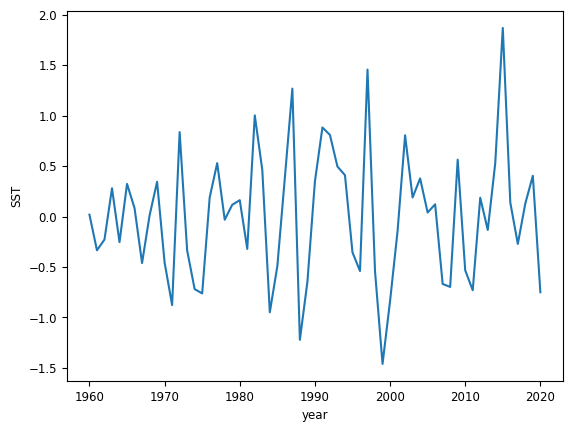

In [293]:
#nino34

from scipy.signal import detrend

# 변수명 (예: 'SST') 설정
varname = cfg_var_SST.var  # 예: 'SST'

# 변수명 (예: 'SST')
varname = cfg_var_SST.var  # 'SST'

# 원본 DataArray 가져오기
ds = cfg_var_SST.ODA_ds_an_enm  # Dataset
sst = ds

# SST가 정확히 0인 값들을 NaN으로 치환
sst = sst.where(sst != 0)
sst = sst - 273.15

# nino34 영역 선택
nino34 = sst.sel(
    lat=slice(-5, 5),     # 
    lon=slice(190, 240)   # 
)

# 2. 영역 평균
nino34_mean = nino34.mean(dim=['lat', 'lon'], skipna=True)  # 결과: (time, ens_ODA)

# # 3. Detrend (time 차원에 대해)
# # scipy.signal.detrend는 numpy array 입력을 원하므로 변환
# nino34_detrended = xr.apply_ufunc(
#     detrend,
#     nino34_mean,
#     input_core_dims=[['year']],
#     output_core_dims=[['year']],
#     vectorize=True,
#     dask='parallelized',
#     output_dtypes=[nino34_mean.dtype]
# )


# nino34_std = (nino34_detrended - nino34_detrended.mean(dim='year')) / nino34_detrended.std(dim='year')
nino34_anom =nino34_mean - nino34_mean.mean(dim='year')

# nino34_std.name = 'nino34_SST_detrended_std'

nino34_anom.plot()

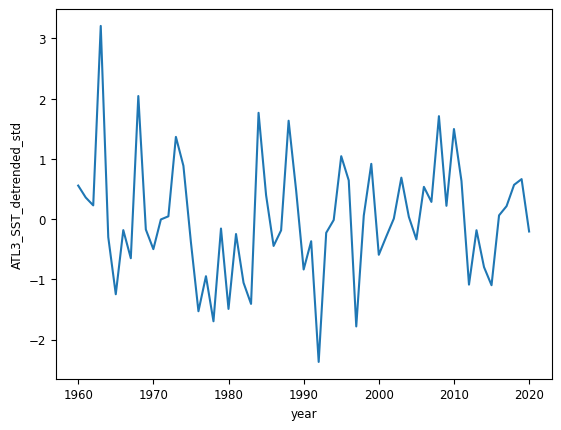

In [208]:
#ATL3

from scipy.signal import detrend

# 변수명 (예: 'SST') 설정
varname = cfg_var_SST.var  # 예: 'SST'

# 변수명 (예: 'SST')
varname = cfg_var_SST.var  # 'SST'

# 원본 DataArray 가져오기
ds = cfg_var_SST.ODA_ds_an_enm  # Dataset
sst = ds

# SST가 정확히 0인 값들을 NaN으로 치환
sst = sst.where(sst != 0)
sst = sst - 273.15

# ATL3 영역 선택
atl3 = sst.sel(
    lat=slice(-3, 3),     # 3°S to 3°N
    lon=slice(340, 360)   # 20°W to 0°
)

# 2. 영역 평균
atl3_mean = atl3.mean(dim=['lat', 'lon'], skipna=True)  # 결과: (time, ens_ODA)

# 3. Detrend (time 차원에 대해)
# scipy.signal.detrend는 numpy array 입력을 원하므로 변환
atl3_detrended = xr.apply_ufunc(
    detrend,
    atl3_mean,
    input_core_dims=[['year']],
    output_core_dims=[['year']],
    vectorize=True,
    dask='parallelized',
    output_dtypes=[atl3_mean.dtype]
)


atl3_std = (atl3_detrended - atl3_detrended.mean(dim='year')) / atl3_detrended.std(dim='year')
atl3_std.name = 'ATL3_SST_detrended_std'

atl3_std.plot()

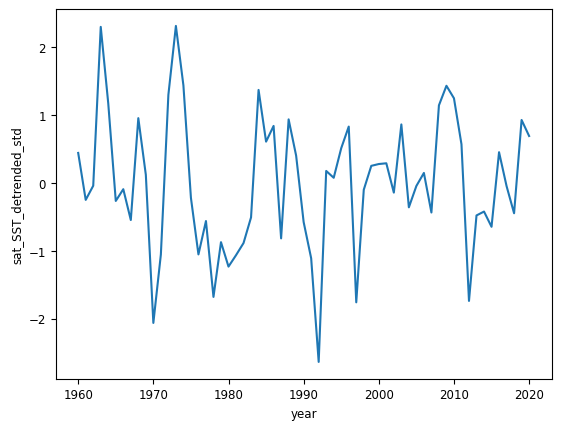

In [210]:
# SAT
from scipy.signal import detrend

# 15°W - 5°E, 20°S - 5°S.
# https://stateoftheocean.osmc.noaa.gov/sur/atl/sat.php

# 변수명 (예: 'SST') 설정
varname = cfg_var_SST.var  # 예: 'SST'

# 변수명 (예: 'SST')
varname = cfg_var_SST.var  # 'SST'

# 원본 DataArray 가져오기
ds = cfg_var_SST.ODA_ds_an_enm  # Dataset
sst = ds

# SST가 정확히 0인 값들을 NaN으로 치환
sst = sst.where(sst != 0)
sst = sst - 273.15

# # sat 영역 선택
# sat = sst.sel(
#     lat=slice(-20, -5),     # 3°S to 3°N
#     lon=slice(345, 365)   # 20°W to 0°
# )

sat1 = sst.sel(lon=slice(345, 360), lat=slice(-20, -5))
sat2 = sst.sel(lon=slice(0, 5), lat=slice(-20, -5))
sat = xr.concat([sat1, sat2], dim='lon')


# 2. 영역 평균
sat_mean = sat.mean(dim=['lat', 'lon'], skipna=True)  # 결과: (time, ens_ODA)

# 3. Detrend (time 차원에 대해)
# scipy.signal.detrend는 numpy array 입력을 원하므로 변환
sat_detrended = xr.apply_ufunc(
    detrend,
    sat_mean,
    input_core_dims=[['year']],
    output_core_dims=[['year']],
    vectorize=True,
    dask='parallelized',
    output_dtypes=[sat_mean.dtype]
)


sat_std = (sat_detrended - sat_detrended.mean(dim='year')) / sat_detrended.std(dim='year')
sat_std.name = 'sat_SST_detrended_std'

sat_std.plot()

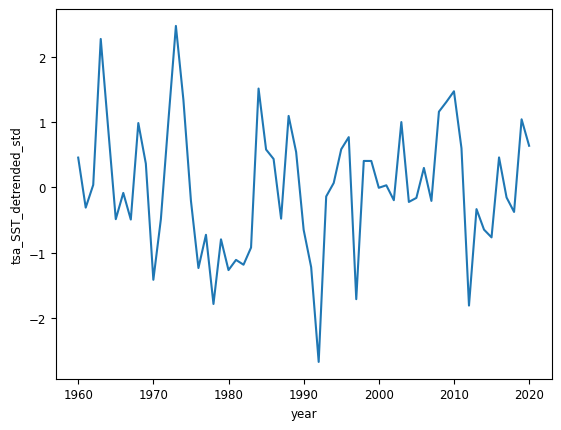

In [229]:
# tsa
from scipy.signal import detrend

# 30°W - 10°E, 20°S - 0°S.
#https://wmolc.org/contents/index/Climate+Indices

# 변수명 (예: 'SST') 설정
varname = cfg_var_SST.var  # 예: 'SST'

# 변수명 (예: 'SST')
varname = cfg_var_SST.var  # 'SST'

# 원본 DataArray 가져오기
ds = cfg_var_SST.ODA_ds_an_enm  # Dataset
sst = ds

# SST가 정확히 0인 값들을 NaN으로 치환
sst = sst.where(sst != 0)
sst = sst - 273.15

# # tsa 영역 선택
# tsa = sst.sel(
#     lat=slice(-20, -5),     # 3°S to 3°N
#     lon=slice(345, 365)   # 20°W to 0°
# )

tsa1 = sst.sel(lon=slice(330, 360), lat=slice(-20, 0))
tsa2 = sst.sel(lon=slice(0, 10), lat=slice(-20, 0))
tsa = xr.concat([tsa1, tsa2], dim='lon')


# 2. 영역 평균
tsa_mean = tsa.mean(dim=['lat', 'lon'], skipna=True)  # 결과: (time, ens_ODA)

# 3. Detrend (time 차원에 대해)
# scipy.signal.detrend는 numpy array 입력을 원하므로 변환
tsa_detrended = xr.apply_ufunc(
    detrend,
    tsa_mean,
    input_core_dims=[['year']],
    output_core_dims=[['year']],
    vectorize=True,
    dask='parallelized',
    output_dtypes=[tsa_mean.dtype]
)


tsa_std = (tsa_detrended - tsa_detrended.mean(dim='year')) / tsa_detrended.std(dim='year')
tsa_std.name = 'tsa_SST_detrended_std'

tsa_std.plot()

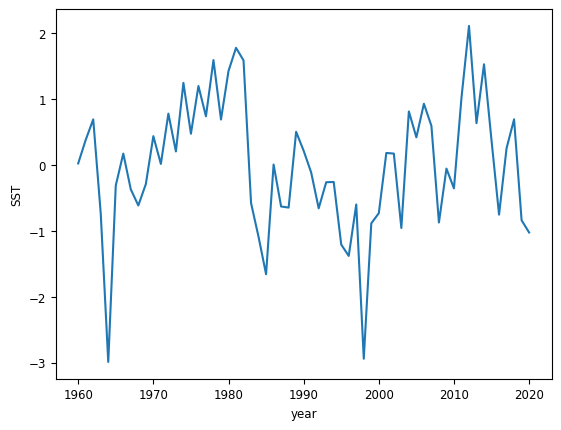

In [240]:
# SASD
# The SASD-index can be obtained either using EOF analysis, where the SASD represents the 1st EOF of the SST anomalies in the South Atlantic, 
# or by calculating directly the difference between SST anomalies averaged in its Southwestern pole 
# (SW: 10W–30W; 30S–40S) minus those averaged for the Northeastern pole (NE: 0E–20W;15S–25S) (Morioka et al. 2011).
# It was shown to be linked to changes in South American precipitation (PPT) 
# (Taschetto and Wainer 2008; Wainer and Venegas 2002; Wainer et al. 2014).

#https://link.springer.com/article/10.1007/s00382-020-05468-z

# 변수명 (예: 'SST') 설정
varname = cfg_var_SST.var  # 예: 'SST'

# 원본 DataArray 가져오기
ds = cfg_var_SST.ODA_ds_an_enm  # Dataset
sst = ds

# SST가 정확히 0인 값들을 NaN으로 치환
sst = sst.where(sst != 0)
sst = sst - 273.15

sasd_sp = sst.sel(lon=slice(330, 350), lat=slice(-40, -30)).mean(dim=['lat', 'lon'], skipna=True)
sasd_np = sst.sel(lon=slice(340, 360), lat=slice(-25, -15)).mean(dim=['lat', 'lon'], skipna=True)

sasd_mean = sasd_sp - sasd_np


# # 3. Detrend (time 차원에 대해)
# # scipy.signal.detrend는 numpy array 입력을 원하므로 변환
# sasd_detrended = xr.apply_ufunc(
#     detrend,
#     sasd_mean,
#     input_core_dims=[['year']],
#     output_core_dims=[['year']],
#     vectorize=True,
#     dask='parallelized',
#     output_dtypes=[sasd_mean.dtype]
# )


# sasd_std = (sasd_detrended - sasd_detrended.mean(dim='year')) / sasd_detrended.std(dim='year')
sasd_std = (sasd_mean - sasd_mean.mean(dim='year')) / sasd_mean.std(dim='year')
sasd_std.name = 'sasd_SST_std'

sasd_sp_detrended = xr.apply_ufunc(
    detrend,
    sasd_sp,
    input_core_dims=[['year']],
    output_core_dims=[['year']],
    vectorize=True,
    dask='parallelized',
    output_dtypes=[sasd_mean.dtype]
)
sasd_sp_std = (sasd_sp_detrended - sasd_sp_detrended.mean(dim='year')) / sasd_sp_detrended.std(dim='year')

# sasd_std.plot()
sasd_sp_std.plot()

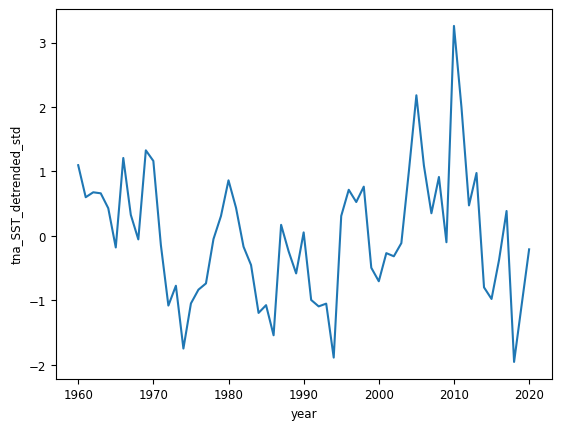

In [211]:
# TNA

from scipy.signal import detrend

# 55°W - 15°W, 5°N - 25°N.
# https://stateoftheocean.osmc.noaa.gov/sur/atl/tna.php

# 변수명 (예: 'SST') 설정
varname = cfg_var_SST.var  # 예: 'SST'

# 변수명 (예: 'SST')
varname = cfg_var_SST.var  # 'SST'

# 원본 DataArray 가져오기
ds = cfg_var_SST.ODA_ds_an_enm  # Dataset
sst = ds

# SST가 정확히 0인 값들을 NaN으로 치환
sst = sst.where(sst != 0)
sst = sst - 273.15

# tna 영역 선택
tna = sst.sel(
    lat=slice(5, 25),     # 3°S to 3°N
    lon=slice(305, 345)   # 20°W to 0°
)


# 2. 영역 평균
tna_mean = tna.mean(dim=['lat', 'lon'], skipna=True)  # 결과: (time, ens_ODA)

# 3. Detrend (time 차원에 대해)
# scipy.signal.detrend는 numpy array 입력을 원하므로 변환
tna_detrended = xr.apply_ufunc(
    detrend,
    tna_mean,
    input_core_dims=[['year']],
    output_core_dims=[['year']],
    vectorize=True,
    dask='parallelized',
    output_dtypes=[tna_mean.dtype]
)


tna_std = (tna_detrended - tna_detrended.mean(dim='year')) / tna_detrended.std(dim='year')
tna_std.name = 'tna_SST_detrended_std'

tna_std.plot()

In [249]:
# PSL processing

cfg_var_PSL=CESM2_config()
cfg_var_PSL.year_s=1960
cfg_var_PSL.year_e=2020
cfg_var_PSL.setvar('PSL')

# Read ODA dataset (projd only)
start_time = time.time()

#PSL
cfg_var_PSL.ODA_path_load(cfg_var_PSL.var)

cfg_var_PSL.ODA_ds = xr.open_mfdataset(cfg_var_PSL.ODA_file_list[0][10:20], 
                           chunks={'time': 2}, 
                           combine='nested', 
                           concat_dim=[[*cfg_var_PSL.ODA_ensembles[10:20]], 'time'], 
                           parallel=True,
                           preprocess=lambda ds: process_coords(ds, start_date, end_date, 'lnd'),
                           decode_cf=True, 
                           decode_times=True)

cfg_var_PSL.ODA_ds = cfg_var_PSL.ODA_ds.rename({"concat_dim": "ens_ODA"})
new_time = cfg_var_PSL.ODA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var_PSL.ODA_ds.time))
cfg_var_PSL.ODA_ds = cfg_var_PSL.ODA_ds.assign_coords(time=new_time)
cfg_var_PSL.ODA_ds=cfg_var_PSL.ODA_ds.compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading ODA: ' + str(elapsed_time))


cfg_var_PSL.ODA_ds_filtered = cfg_var_PSL.ODA_ds
cfg_var_PSL.ODA_ds_an = cfg_var_PSL.ODA_ds_filtered.groupby('time.year').mean(dim='time', skipna=True).compute()
cfg_var_PSL.ODA_ds_an_enm=cfg_var_PSL.ODA_ds_an[cfg_var_PSL.var].mean(dim='ens_ODA')




elasped time for reading ODA: 18.173967838287354


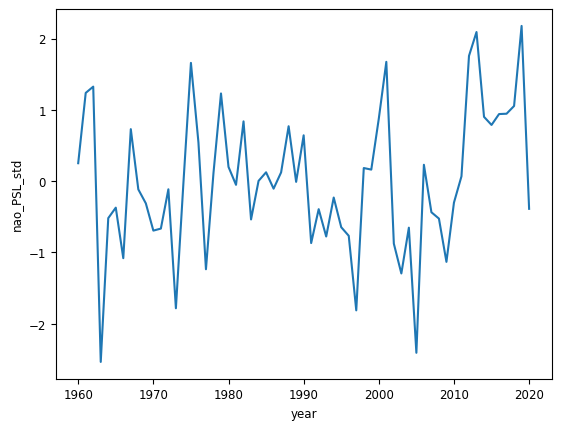

In [253]:
# NAO
# NAO (station-based) (Annual, DJFM, monthly)
# NAOA (Azores)
# Lon -28~-20E
# Lat 36 ~ 40N
# NAOI (Iceland)
# Lon -25 ~ -16
# Lat 63 ~ 70N
# (NAOA - NAOI)?
# The station based NAO index may not be an optimal representation of the associated spatial pattern.

# However, it is necessary to bear in mind that all the analyses performed 
# in this paper are based on the use of anomaly composites (mean field removed), 
# which considerably removes the impact of model inadequacies on our results. (Trigo et al. 2002) 
# These anomaly fields were computed after removing the winter climatology 
# from the corresponding composited monthly fields of high and low NAO index composites.


# 변수명 (예: 'PSL') 설정
varname = cfg_var_PSL.var  # 예: 'PSL'

# 원본 DataArray 가져오기
ds = cfg_var_PSL.ODA_ds_an  # Dataset
PSL = ds

# PSL가 정확히 0인 값들을 NaN으로 치환
PSL = PSL.where(PSL != 0)
PSL = PSL - 273.15

nao_sp = PSL.sel(lon=slice(332, 340), lat=slice(36, 40)).mean(dim=['lat', 'lon'], skipna=True)
nao_np = PSL.sel(lon=slice(335, 344), lat=slice(63, 70)).mean(dim=['lat', 'lon'], skipna=True)

nao_mean = nao_sp - nao_np
nao_mean=nao_mean['PSL'].mean(dim='ens_ODA')


# # 3. Detrend (time 차원에 대해)
# # scipy.signal.detrend는 numpy array 입력을 원하므로 변환
# nao_detrended = xr.apply_ufunc(
#     detrend,
#     nao_mean,
#     input_core_dims=[['year']],
#     output_core_dims=[['year']],
#     vectorize=True,
#     dask='parallelized',
#     output_dtypes=[nao_mean.dtype]
# )


# nao_std = (nao_detrended - nao_detrended.mean(dim='year')) / nao_detrended.std(dim='year')
nao_std = (nao_mean - nao_mean.mean(dim='year')) / nao_mean.std(dim='year')
nao_std.name = 'nao_PSL_std'

# nao_std.plot()
nao_std.plot()

Target point: lon=12, lat=0
Closest point coordinates (LE): lon=12.5, lat=0.47119998931884766
Target point: lon=22, lat=-30
Closest point coordinates (LE): lon=22.5, lat=-29.68589973449707
Target point: lon=277, lat=32
Closest point coordinates (LE): lon=277.5, lat=31.57069969177246
Target point: lon=320, lat=-6
Closest point coordinates (LE): lon=320.0, lat=-6.125699996948242
Target point: lon=308, lat=-27
Closest point coordinates (LE): lon=307.5, lat=-26.858600616455078


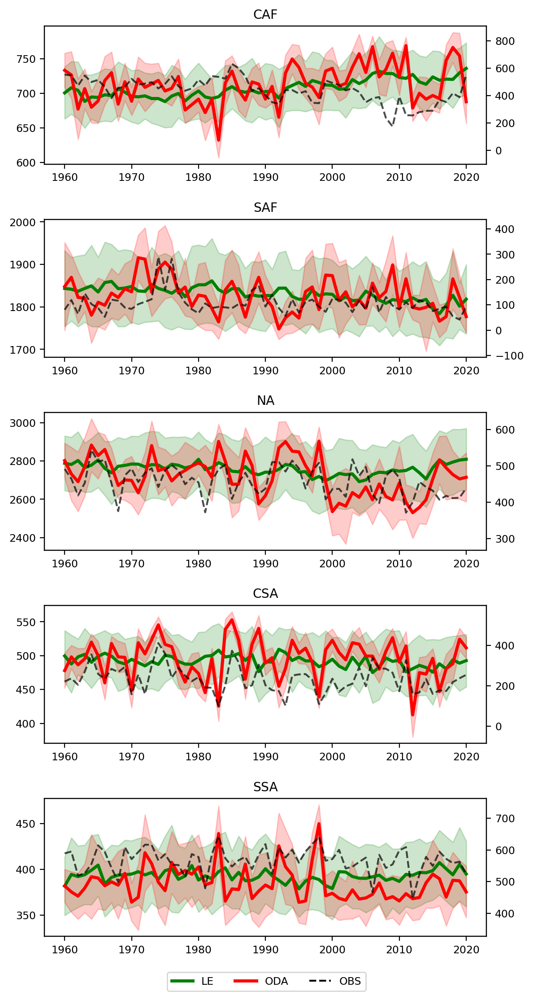

In [178]:
def process_point(ax, ax2, point, cfg_var, le_data, oda_data, obs_data):
    target_lon, target_lat = point

    # Ensure lon is within 0–360 if necessary
    if target_lon < 0 and le_data.lon.max() > 180:
        target_lon = target_lon % 360

    # Use xarray's nearest selection
    le_point = le_data.sel(lon=target_lon, lat=target_lat, method='nearest')
    oda_point = oda_data.sel(lon=target_lon, lat=target_lat, method='nearest')
    obs_point = obs_data.sel(lon=target_lon, lat=target_lat, method='nearest')

    print(f"Target point: lon={target_lon}, lat={target_lat}")
    print(f"Closest point coordinates (LE): lon={le_point.lon.values}, lat={le_point.lat.values}")

    plot_time_series_point(ax, ax2, le_point, oda_point, obs_point, cfg_var)


def plot_time_series_point(ax, ax2, le_point, oda_point, obs_point, cfg_var):
    # Extract time axis
    years = le_point.year.values

    # LE
    le_mean = le_point[cfg_var.var].mean(dim='ens_LE').squeeze().values
    le_std = le_point[cfg_var.var].std(dim='ens_LE').squeeze().values

    ax.fill_between(years, le_mean - le_std, le_mean + le_std, color='green', alpha=0.2)
    ax.plot(years, le_mean, color='green', linewidth=2.5)

    # ODA
    oda_mean = oda_point[cfg_var.var].mean(dim='ens_ODA').squeeze().values
    oda_std = oda_point[cfg_var.var].std(dim='ens_ODA').squeeze().values

    ax.fill_between(years, oda_mean - oda_std, oda_mean + oda_std, color='red', alpha=0.2)
    ax.plot(years, oda_mean, color='red', linewidth=2.5)

    # OBS
    obs_vals = obs_point[cfg_var.var].squeeze().values
    ax2.plot(years, obs_vals, color='black', alpha=0.7, linewidth=1.5, linestyle='--')

    # Adjust y-limits for visibility
    ymin, ymax = ax2.get_ylim()
    ax2.set_ylim(ymin - (ymax - ymin) / 2, ymax + (ymax - ymin) / 2)


# Target points (name: (lon, lat))
points = {
    "CAF": (12, 0),
    "SAF": (22, -30),
    "NA": (277, 32),
    "CSA": (320, -6),
    "SSA": (308, -27),
}

# Create figure
fig, ax = plt.subplots(nrows=5, ncols=1, figsize=(6, 12), dpi=200, constrained_layout=False)

for idx, (point_name, point_coords) in enumerate(points.items()):
    ax2 = ax[idx].twinx()
    process_point(ax[idx], ax2, point_coords, cfg_var_TWS,
                  cfg_var_TWS.LE_ds_an,
                  cfg_var_TWS.ODA_ds_an,
                  cfg_var_TWS.OBS_ds_an)
    ax[idx].set_title(point_name)

# # Collect legend handles
# lines_ax, labels_ax = ax[0].get_legend_handles_labels()
# lines_ax2, labels_ax2 = ax2.get_legend_handles_labels()
# fig.legend(lines_ax + lines_ax2, labels_ax + labels_ax2,
#            loc='upper center', bbox_to_anchor=(0.5, 0), ncol=2)

from matplotlib.lines import Line2D

legend_lines = [
    Line2D([0], [0], color='green', lw=2.5, label='LE'),
    Line2D([0], [0], color='red', lw=2.5, label='ODA'),
    Line2D([0], [0], color='black', lw=1.5, linestyle='--', label='OBS'),
]

fig.legend(handles=legend_lines, loc='upper center', bbox_to_anchor=(0.5, 0), ncol=3)

plt.tight_layout(rect=[0, 0, 1, 0.9])
plt.subplots_adjust(hspace=0.4)
plt.show()

Target point: lon=149, lat=-24
Closest point coordinates (LE): lon=148.75, lat=-24.031400680541992


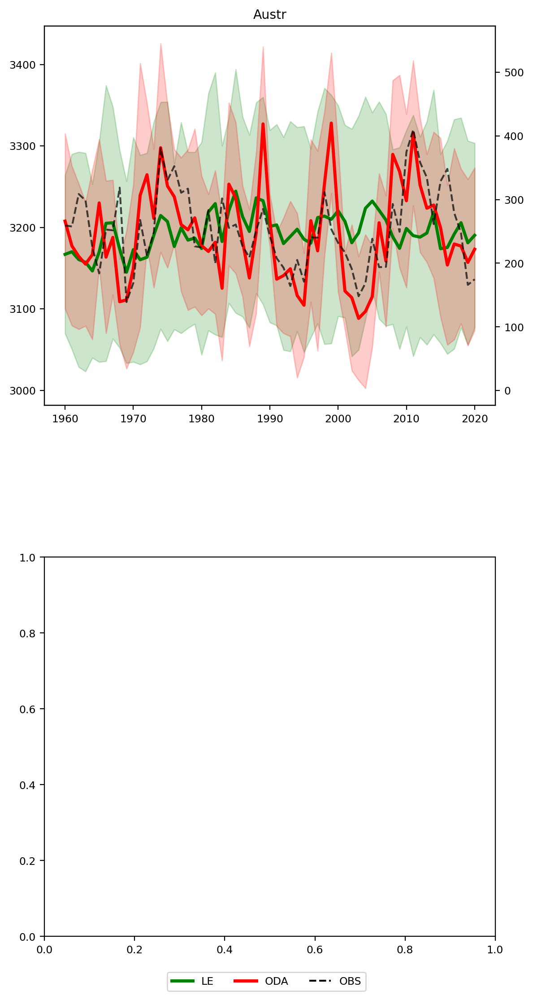

In [295]:
#timeseries for Pacific

def process_point(ax, ax2, point, cfg_var, le_data, oda_data, obs_data):
    target_lon, target_lat = point

    # Ensure lon is within 0–360 if necessary
    if target_lon < 0 and le_data.lon.max() > 180:
        target_lon = target_lon % 360

    # Use xarray's nearest selection
    le_point = le_data.sel(lon=target_lon, lat=target_lat, method='nearest')
    oda_point = oda_data.sel(lon=target_lon, lat=target_lat, method='nearest')
    obs_point = obs_data.sel(lon=target_lon, lat=target_lat, method='nearest')

    print(f"Target point: lon={target_lon}, lat={target_lat}")
    print(f"Closest point coordinates (LE): lon={le_point.lon.values}, lat={le_point.lat.values}")

    plot_time_series_point(ax, ax2, le_point, oda_point, obs_point, cfg_var)


def plot_time_series_point(ax, ax2, le_point, oda_point, obs_point, cfg_var):
    # Extract time axis
    years = le_point.year.values

    # LE
    le_mean = le_point[cfg_var.var].mean(dim='ens_LE').squeeze().values
    le_std = le_point[cfg_var.var].std(dim='ens_LE').squeeze().values

    ax.fill_between(years, le_mean - le_std, le_mean + le_std, color='green', alpha=0.2)
    ax.plot(years, le_mean, color='green', linewidth=2.5)

    # ODA
    oda_mean = oda_point[cfg_var.var].mean(dim='ens_ODA').squeeze().values
    oda_std = oda_point[cfg_var.var].std(dim='ens_ODA').squeeze().values

    ax.fill_between(years, oda_mean - oda_std, oda_mean + oda_std, color='red', alpha=0.2)
    ax.plot(years, oda_mean, color='red', linewidth=2.5)

    # OBS
    obs_vals = obs_point[cfg_var.var].squeeze().values
    ax2.plot(years, obs_vals, color='black', alpha=0.7, linewidth=1.5, linestyle='--')

    # Adjust y-limits for visibility
    ymin, ymax = ax2.get_ylim()
    ax2.set_ylim(ymin - (ymax - ymin) / 2, ymax + (ymax - ymin) / 2)


# Target points (name: (lon, lat))
points = {
    "Austr": (149, -24),
    "Austr": (149, -24),
}

# Create figure
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(6, 12), dpi=200, constrained_layout=False)

for idx, (point_name, point_coords) in enumerate(points.items()):
    ax2 = ax[idx].twinx()
    process_point(ax[idx], ax2, point_coords, cfg_var_TWS,
                  cfg_var_TWS.LE_ds_an,
                  cfg_var_TWS.ODA_ds_an,
                  cfg_var_TWS.OBS_ds_an)
    ax[idx].set_title(point_name)

# # Collect legend handles
# lines_ax, labels_ax = ax[0].get_legend_handles_labels()
# lines_ax2, labels_ax2 = ax2.get_legend_handles_labels()
# fig.legend(lines_ax + lines_ax2, labels_ax + labels_ax2,
#            loc='upper center', bbox_to_anchor=(0.5, 0), ncol=2)

from matplotlib.lines import Line2D

legend_lines = [
    Line2D([0], [0], color='green', lw=2.5, label='LE'),
    Line2D([0], [0], color='red', lw=2.5, label='ODA'),
    Line2D([0], [0], color='black', lw=1.5, linestyle='--', label='OBS'),
]

fig.legend(handles=legend_lines, loc='upper center', bbox_to_anchor=(0.5, 0), ncol=3)

plt.tight_layout(rect=[0, 0, 1, 0.9])
plt.subplots_adjust(hspace=0.4)
plt.show()

In [222]:
# def process_point(ax, ax2, ax_bar, point, cfg_var, le_data, oda_data, obs_data, index_ts):
#     target_lon, target_lat = point

#     # 경도 보정
#     if target_lon < 0 and le_data.lon.max() > 180:
#         target_lon = target_lon % 360

#     # 데이터 선택
#     le_point = le_data.sel(lon=target_lon, lat=target_lat, method='nearest')
#     oda_point = oda_data.sel(lon=target_lon, lat=target_lat, method='nearest')
#     obs_point = obs_data.sel(lon=target_lon, lat=target_lat, method='nearest')

#     # 시간 축
#     years = le_point.year.values

#     # LE
#     le_mean = le_point[cfg_var.var].mean(dim='ens_LE').squeeze().values
#     le_std = le_point[cfg_var.var].std(dim='ens_LE').squeeze().values
#     ax.fill_between(years, le_mean - le_std, le_mean + le_std, color='green', alpha=0.2)
#     ax.plot(years, le_mean, color='green', linewidth=2.5)

#     # ODA
#     oda_mean = oda_point[cfg_var.var].mean(dim='ens_ODA').squeeze().values
#     oda_std = oda_point[cfg_var.var].std(dim='ens_ODA').squeeze().values
#     ax.fill_between(years, oda_mean - oda_std, oda_mean + oda_std, color='red', alpha=0.2)
#     ax.plot(years, oda_mean, color='red', linewidth=2.5)

#     # OBS
#     obs_vals = obs_point[cfg_var.var].squeeze().values
#     ax2.plot(years, obs_vals, color='black', alpha=0.7, linewidth=1.5, linestyle='--')

#     # bar plot 추가
#     if index_ts is not None:
#         ax_bar.bar(years, index_ts, color='royalblue')
#         ax_bar.axhline(0, color='gray', linewidth=0.8)
#         ax_bar.set_xlim(years[0], years[-1])
#         ax_bar.set_ylim(-3, 3)
#         ax_bar.set_yticks([-2, 0, 2])
#         ax_bar.set_ylabel("Index", fontsize=8)


# # 예시 인덱스 데이터 준비 (실제 데이터로 교체)
# years = cfg_var_TWS.LE_ds_an.year.values

# # mapping
# index_map = {
#     "CAF": atl3_std,
#     "CSA": atl3_std,
#     "SAF": sat_std,
#     "SSA": sat_std,
#     "NA": tna_std,
# }

# # Create figure (3 axes per row: ax, ax2, ax_bar)
# fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(8, 12), dpi=200,
#                         gridspec_kw={'height_ratios': [2, 2, 2, 2, 2], 'hspace': 0.4})

# for idx, (point_name, point_coords) in enumerate(points.items()):
#     ax = axs[idx, 0]
#     ax2 = ax.twinx()
#     ax_bar = axs[idx, 1]
#     index_ts = index_map[point_name]

#     process_point(ax, ax2, ax_bar, point_coords, cfg_var_TWS,
#                   cfg_var_TWS.LE_ds_an,
#                   cfg_var_TWS.ODA_ds_an,
#                   cfg_var_TWS.OBS_ds_an,
#                   index_ts)

#     ax.set_title(point_name, fontsize=10)
#     ax_bar.set_title(f"{point_name} SST Index", fontsize=9)

# # 범례 추가
# from matplotlib.lines import Line2D
# legend_lines = [
#     Line2D([0], [0], color='green', lw=2.5, label='LE'),
#     Line2D([0], [0], color='red', lw=2.5, label='ODA'),
#     Line2D([0], [0], color='black', lw=1.5, linestyle='--', label='OBS'),
# ]
# fig.legend(handles=legend_lines, loc='upper center', bbox_to_anchor=(0.5, 0.98), ncol=3)

# plt.tight_layout(rect=[0, 0, 1, 0.95])
# plt.show()

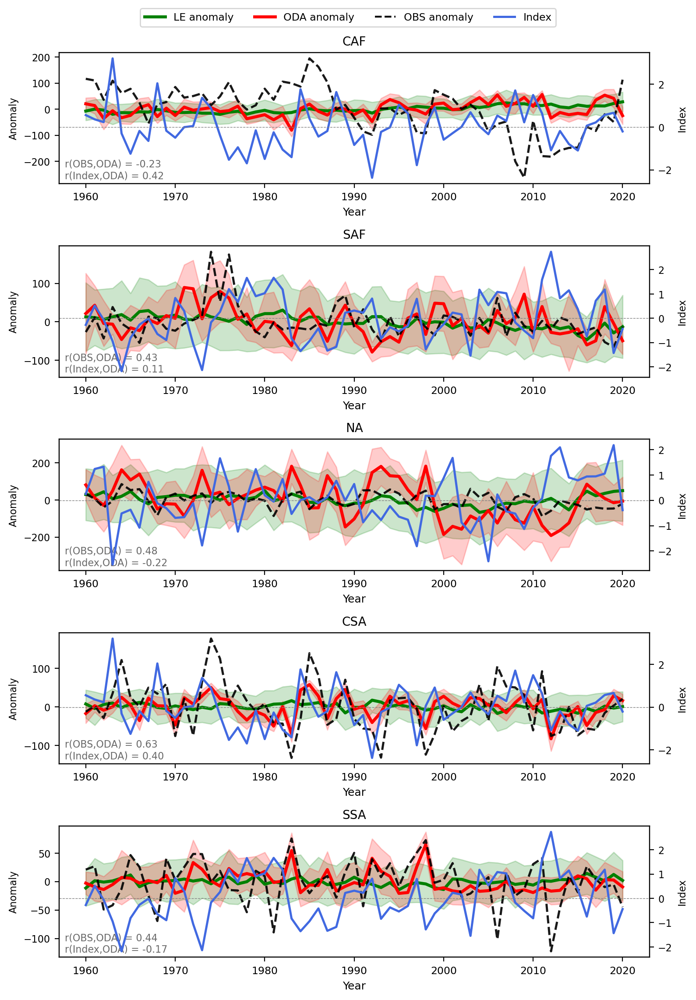

In [254]:
# mapping, timeseries
# index_map = {
#     "CAF": atl3_std,
#     "CSA": atl3_std,
#     "SAF": tsa_std,
#     "SSA": tsa_std,
#     "NA": tna_std,
# } # tsa shows poor correlation
# index_map = {
#     "CAF": atl3_std,
#     "CSA": atl3_std,
#     "SAF": sasd_std,
#     "SSA": sasd_std,
#     "NA": tna_std,
# } # tna show poor correlation
index_map = {
    "CAF": atl3_std,
    "CSA": atl3_std,
    "SAF": sasd_std,
    "SSA": sasd_std,
    "NA": nao_std,
}
# Target points (name: (lon, lat))
points = {
    "CAF": (12, 0),
    "SAF": (22, -30),
    "NA": (277, 32),
    "CSA": (320, -6),
    "SSA": (308, -27),
}

def process_point(ax, ax2, point, cfg_var, le_data, oda_data, obs_data, index_ts):
    target_lon, target_lat = point

    if target_lon < 0 and le_data.lon.max() > 180:
        target_lon = target_lon % 360

    le_point = le_data.sel(lon=target_lon, lat=target_lat, method='nearest')
    oda_point = oda_data.sel(lon=target_lon, lat=target_lat, method='nearest')
    obs_point = obs_data.sel(lon=target_lon, lat=target_lat, method='nearest')

    years = le_point.year.values

    # --- LE anomaly ---
    le_all = le_point[cfg_var.var].squeeze()
    le_anom = le_all - le_all.mean(dim='year')
    le_mean = le_anom.mean(dim='ens_LE').values
    le_std = le_anom.std(dim='ens_LE').values
    ax.fill_between(years, le_mean - le_std, le_mean + le_std, color='green', alpha=0.2)
    ax.plot(years, le_mean, color='green', linewidth=2.5)

    # --- ODA anomaly ---
    oda_all = oda_point[cfg_var.var].squeeze()
    oda_anom = oda_all - oda_all.mean(dim='year')
    oda_mean = oda_anom.mean(dim='ens_ODA').values
    oda_std = oda_anom.std(dim='ens_ODA').values
    ax.fill_between(years, oda_mean - oda_std, oda_mean + oda_std, color='red', alpha=0.2)
    ax.plot(years, oda_mean, color='red', linewidth=2.5)

    # --- OBS anomaly ---
    obs_vals = obs_point[cfg_var.var].squeeze().values
    obs_anom = obs_vals - np.nanmean(obs_vals)
    ax.plot(years, obs_anom, color='black', alpha=0.9, linewidth=1.8, linestyle='--')

    # --- Index as blue line on secondary y-axis ---
    if index_ts is not None:
        ax2.plot(years, index_ts, color='royalblue', linewidth=1.8)
        ax2.axhline(0, color='gray', linewidth=0.5, linestyle='--')
        ax2.set_ylabel("Index", fontsize=8)
        ax2.tick_params(axis='y', labelsize=8)

    # --- Correlation (ODA–OBS) ---
    valid1 = np.isfinite(obs_anom) & np.isfinite(oda_mean)
    if valid1.sum() > 2:
        corr_obs = np.corrcoef(obs_anom[valid1], oda_mean[valid1])[0, 1]
        corr_obs_str = f"r(OBS,ODA) = {corr_obs:.2f}"
    else:
        corr_obs_str = "r(OBS,ODA) = NaN"

    # --- Correlation (Index–ODA) ---
    valid2 = np.isfinite(index_ts) & np.isfinite(oda_mean)
    if valid2.sum() > 2:
        corr_idx = np.corrcoef(index_ts[valid2], oda_mean[valid2])[0, 1]
        corr_idx_str = f"r(Index,ODA) = {corr_idx:.2f}"
    else:
        corr_idx_str = "r(Index,ODA) = NaN"

    # --- Correlation (Index–ODA) ---
    valid3 = np.isfinite(index_ts) & np.isfinite(obs_anom)
    if valid3.sum() > 2:
        corr_oidx = np.corrcoef(index_ts[valid3], obs_anom[valid3])[0, 1]
        corr_oidx_str = f"r(Index,OBS) = {corr_oidx:.2f}"
    else:
        corr_oidx_str = "r(Index,OBS) = NaN"

    # # --- Annotate ---
    # ax.text(0.01, 0.02,
    #         f"{corr_obs_str}\n{corr_idx_str}\n{corr_oidx_str}",
    #         transform=ax.transAxes,
    #         fontsize=8, color='dimgray',
    #         ha='left', va='bottom')
    # --- Annotate ---
    ax.text(0.01, 0.02,
        f"{corr_obs_str}\n{corr_idx_str}",
        transform=ax.transAxes,
        fontsize=8, color='dimgray',
        ha='left', va='bottom')



fig, ax_list = plt.subplots(nrows=5, ncols=1, figsize=(8, 12), dpi=200)

for idx, (point_name, point_coords) in enumerate(points.items()):
    ax = ax_list[idx]
    ax2 = ax.twinx()
    index_ts = index_map[point_name].sel(year=years).values

    process_point(ax, ax2, point_coords, cfg_var_TWS,
                  cfg_var_TWS.LE_ds_an,
                  cfg_var_TWS.ODA_ds_an,
                  cfg_var_TWS.OBS_ds_an,
                  index_ts)

    ax.set_title(point_name, fontsize=10)
    ax.tick_params(axis='y', labelsize=8)
    ax.set_xlabel('Year', fontsize=9)
    ax.set_ylabel('Anomaly', fontsize=8)

# --- 범례 ---
from matplotlib.lines import Line2D
legend_lines = [
    Line2D([0], [0], color='green', lw=2.5, label='LE anomaly'),
    Line2D([0], [0], color='red', lw=2.5, label='ODA anomaly'),
    Line2D([0], [0], color='black', lw=1.5, linestyle='--', label='OBS anomaly'),
    Line2D([0], [0], color='royalblue', lw=1.8, label='Index'),
]
fig.legend(handles=legend_lines, loc='upper center', bbox_to_anchor=(0.5, 0.95), ncol=4)

# --- 레이아웃 정리 ---
plt.tight_layout(rect=[0, 0, 1, 0.93])
plt.show()


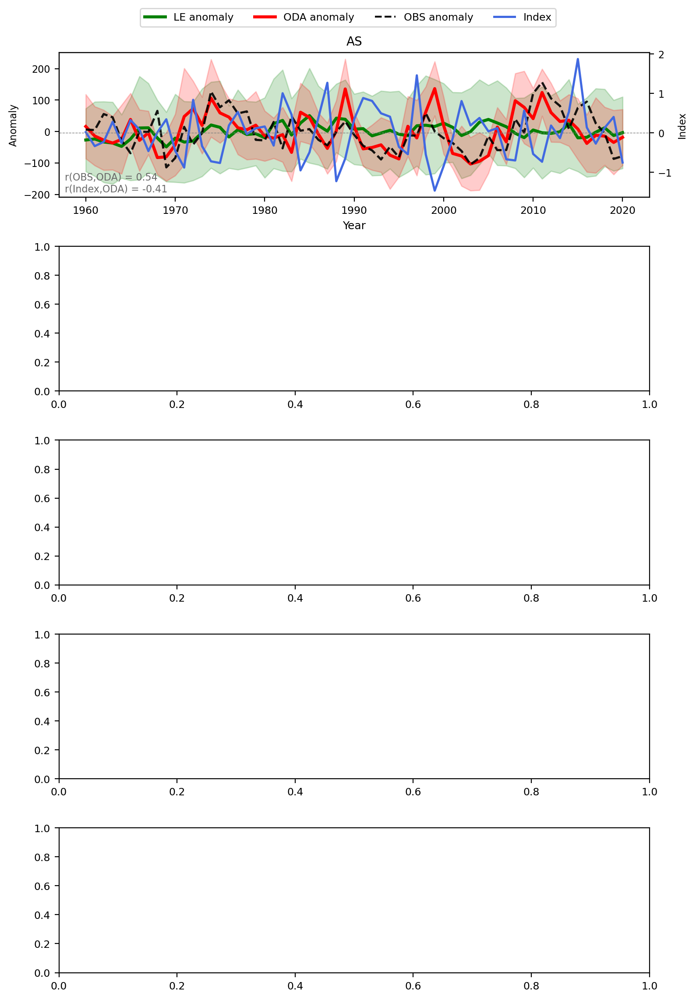

In [297]:
# mapping for Pacific as well

# mapping
# index_map = {
#     "CAF": atl3_std,
#     "CSA": atl3_std,
#     "SAF": tsa_std,
#     "SSA": tsa_std,
#     "NA": tna_std,
# } # tsa shows poor correlation
# index_map = {
#     "CAF": atl3_std,
#     "CSA": atl3_std,
#     "SAF": sasd_std,
#     "SSA": sasd_std,
#     "NA": tna_std,
# } # tna show poor correlation
index_map = {
    "AS": nino34_anom,
    "AS": nino34_anom,
}
# Target points (name: (lon, lat))
points = {
    "AS": (149, -24),
    "AS": (149, -24),
}

def process_point(ax, ax2, point, cfg_var, le_data, oda_data, obs_data, index_ts):
    target_lon, target_lat = point

    if target_lon < 0 and le_data.lon.max() > 180:
        target_lon = target_lon % 360

    le_point = le_data.sel(lon=target_lon, lat=target_lat, method='nearest')
    oda_point = oda_data.sel(lon=target_lon, lat=target_lat, method='nearest')
    obs_point = obs_data.sel(lon=target_lon, lat=target_lat, method='nearest')

    years = le_point.year.values

    # --- LE anomaly ---
    le_all = le_point[cfg_var.var].squeeze()
    le_anom = le_all - le_all.mean(dim='year')
    le_mean = le_anom.mean(dim='ens_LE').values
    le_std = le_anom.std(dim='ens_LE').values
    ax.fill_between(years, le_mean - le_std, le_mean + le_std, color='green', alpha=0.2)
    ax.plot(years, le_mean, color='green', linewidth=2.5)

    # --- ODA anomaly ---
    oda_all = oda_point[cfg_var.var].squeeze()
    oda_anom = oda_all - oda_all.mean(dim='year')
    oda_mean = oda_anom.mean(dim='ens_ODA').values
    oda_std = oda_anom.std(dim='ens_ODA').values
    ax.fill_between(years, oda_mean - oda_std, oda_mean + oda_std, color='red', alpha=0.2)
    ax.plot(years, oda_mean, color='red', linewidth=2.5)

    # --- OBS anomaly ---
    obs_vals = obs_point[cfg_var.var].squeeze().values
    obs_anom = obs_vals - np.nanmean(obs_vals)
    ax.plot(years, obs_anom, color='black', alpha=0.9, linewidth=1.8, linestyle='--')

    # --- Index as blue line on secondary y-axis ---
    if index_ts is not None:
        ax2.plot(years, index_ts, color='royalblue', linewidth=1.8)
        ax2.axhline(0, color='gray', linewidth=0.5, linestyle='--')
        ax2.set_ylabel("Index", fontsize=8)
        ax2.tick_params(axis='y', labelsize=8)

    # --- Correlation (ODA–OBS) ---
    valid1 = np.isfinite(obs_anom) & np.isfinite(oda_mean)
    if valid1.sum() > 2:
        corr_obs = np.corrcoef(obs_anom[valid1], oda_mean[valid1])[0, 1]
        corr_obs_str = f"r(OBS,ODA) = {corr_obs:.2f}"
    else:
        corr_obs_str = "r(OBS,ODA) = NaN"

    # --- Correlation (Index–ODA) ---
    valid2 = np.isfinite(index_ts) & np.isfinite(oda_mean)
    if valid2.sum() > 2:
        corr_idx = np.corrcoef(index_ts[valid2], oda_mean[valid2])[0, 1]
        corr_idx_str = f"r(Index,ODA) = {corr_idx:.2f}"
    else:
        corr_idx_str = "r(Index,ODA) = NaN"

    # --- Correlation (Index–ODA) ---
    valid3 = np.isfinite(index_ts) & np.isfinite(obs_anom)
    if valid3.sum() > 2:
        corr_oidx = np.corrcoef(index_ts[valid3], obs_anom[valid3])[0, 1]
        corr_oidx_str = f"r(Index,OBS) = {corr_oidx:.2f}"
    else:
        corr_oidx_str = "r(Index,OBS) = NaN"

    # # --- Annotate ---
    # ax.text(0.01, 0.02,
    #         f"{corr_obs_str}\n{corr_idx_str}\n{corr_oidx_str}",
    #         transform=ax.transAxes,
    #         fontsize=8, color='dimgray',
    #         ha='left', va='bottom')
    # --- Annotate ---
    ax.text(0.01, 0.02,
        f"{corr_obs_str}\n{corr_idx_str}",
        transform=ax.transAxes,
        fontsize=8, color='dimgray',
        ha='left', va='bottom')



fig, ax_list = plt.subplots(nrows=5, ncols=1, figsize=(8, 12), dpi=200)

for idx, (point_name, point_coords) in enumerate(points.items()):
    ax = ax_list[idx]
    ax2 = ax.twinx()
    index_ts = index_map[point_name].sel(year=years).values

    process_point(ax, ax2, point_coords, cfg_var_TWS,
                  cfg_var_TWS.LE_ds_an,
                  cfg_var_TWS.ODA_ds_an,
                  cfg_var_TWS.OBS_ds_an,
                  index_ts)

    ax.set_title(point_name, fontsize=10)
    ax.tick_params(axis='y', labelsize=8)
    ax.set_xlabel('Year', fontsize=9)
    ax.set_ylabel('Anomaly', fontsize=8)

# --- 범례 ---
from matplotlib.lines import Line2D
legend_lines = [
    Line2D([0], [0], color='green', lw=2.5, label='LE anomaly'),
    Line2D([0], [0], color='red', lw=2.5, label='ODA anomaly'),
    Line2D([0], [0], color='black', lw=1.5, linestyle='--', label='OBS anomaly'),
    Line2D([0], [0], color='royalblue', lw=1.8, label='Index'),
]
fig.legend(handles=legend_lines, loc='upper center', bbox_to_anchor=(0.5, 0.95), ncol=4)

# --- 레이아웃 정리 ---
plt.tight_layout(rect=[0, 0, 1, 0.93])
plt.show()


In [304]:
cfg_var_SST.ODA_ds_an

<xarray.Dataset> Size: 135MB
Dimensions:  (year: 61, ens_ODA: 10, lat: 192, lon: 288, lev: 32)
Coordinates:
  * lat      (lat) float64 2kB -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
  * lon      (lon) float64 2kB 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * lev      (lev) float64 256B 3.643 7.595 14.36 24.61 ... 957.5 976.3 992.6
  * ens_ODA  (ens_ODA) int64 80B 10 11 12 13 14 15 16 17 18 19
  * year     (year) int64 488B 1960 1961 1962 1963 1964 ... 2017 2018 2019 2020
Data variables:
    SST      (year, ens_ODA, lat, lon) float32 135MB 0.0 0.0 0.0 ... 271.5 271.5
Attributes:
    Conventions:       CF-1.0
    source:            CAM
    case:              b.e21.BHISTsmbb.f09_g17.assm.projdv7.3_ba-10p1
    logname:           sunseon
    host:              mom1
    initial_file:      b.e21.BHISTsmbb.f09_g17.LE2-1231.011.cam.i.1955-01-01-...
    topography_file:   /mnt/lustre/share/CESM/cesm_input/atm/cam/topo/fv_0.9x...
    model_doi_url:     https://doi.org/10.5065/D67H1H0V
    time_period_freq:  month_1

In [305]:
from scipy.stats import pearsonr
import xarray as xr
import numpy as np

# 정렬
tws_ts, sst = xr.align(
    cfg_var_TWS.ODA_ds_an['TWS'].sel(lon=320, lat=-6, method='nearest'),
    cfg_var_SST.ODA_ds_an['SST'],
    join='inner'
)  # 둘 다 (member, time), (member, time, lat, lon)

# 함수: 단일 멤버에 대해 상관계수 맵 계산
def corr_ts_map(ts, sst_field):
    def pearson_at_point(sst_point):
        if np.isnan(sst_point).all():
            return np.nan
        return pearsonr(ts, sst_point)[0]

    return xr.apply_ufunc(
        pearson_at_point,
        sst_field,
        input_core_dims=[['year']],
        vectorize=True,
        dask='parallelized',
        output_dtypes=[float]
    )

# 멤버별로 반복
corr_maps = []
for m in tws_ts.ens_ODA.values:
    ts_m = tws_ts.sel(ens_ODA=m)
    sst_m = sst.sel(ens_ODA=m)
    corr_m = corr_ts_map(ts_m, sst_m)
    corr_maps.append(corr_m.expand_dims(ens_ODA=[m]))

# stack
corr_map_all = xr.concat(corr_maps, dim='ens_ODA')  # (member, lat, lon)

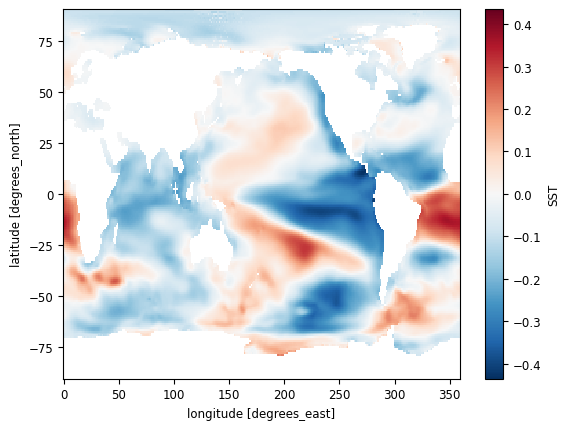

In [315]:
corr_map_all.mean(dim='ens_ODA').plot.pcolormesh()

In [311]:
from scipy.stats import pearsonr
import xarray as xr
import numpy as np

# 정렬
tws_ts, sst = xr.align(
    cfg_var_TWS.ODA_ds_an['TWS'].sel(lon=308, lat=-27, method='nearest'),
    cfg_var_SST.ODA_ds_an['SST'],
    join='inner'
)  # 둘 다 (member, time), (member, time, lat, lon)

# 함수: 단일 멤버에 대해 상관계수 맵 계산
def corr_ts_map(ts, sst_field):
    def pearson_at_point(sst_point):
        if np.isnan(sst_point).all():
            return np.nan
        return pearsonr(ts, sst_point)[0]

    return xr.apply_ufunc(
        pearson_at_point,
        sst_field,
        input_core_dims=[['year']],
        vectorize=True,
        dask='parallelized',
        output_dtypes=[float]
    )

# 멤버별로 반복
corr_maps = []
for m in tws_ts.ens_ODA.values:
    ts_m = tws_ts.sel(ens_ODA=m)
    sst_m = sst.sel(ens_ODA=m)
    corr_m = corr_ts_map(ts_m, sst_m)
    corr_maps.append(corr_m.expand_dims(ens_ODA=[m]))

# stack
corr_map_all2 = xr.concat(corr_maps, dim='ens_ODA')  # (member, lat, lon)

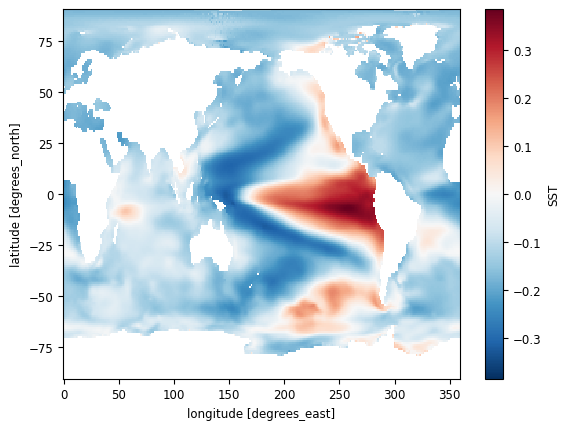

In [313]:
corr_map_all2.mean(dim='ens_ODA').plot.pcolormesh()

In [316]:
from scipy.stats import pearsonr
import xarray as xr
import numpy as np

# 정렬
tws_ts, sst = xr.align(
    cfg_var_TWS.ODA_ds_an['TWS'].sel(lon=277, lat=32, method='nearest'),
    cfg_var_SST.ODA_ds_an['SST'],
    join='inner'
)  # 둘 다 (member, time), (member, time, lat, lon)

# 함수: 단일 멤버에 대해 상관계수 맵 계산
def corr_ts_map(ts, sst_field):
    def pearson_at_point(sst_point):
        if np.isnan(sst_point).all():
            return np.nan
        return pearsonr(ts, sst_point)[0]

    return xr.apply_ufunc(
        pearson_at_point,
        sst_field,
        input_core_dims=[['year']],
        vectorize=True,
        dask='parallelized',
        output_dtypes=[float]
    )

# 멤버별로 반복
corr_maps = []
for m in tws_ts.ens_ODA.values:
    ts_m = tws_ts.sel(ens_ODA=m)
    sst_m = sst.sel(ens_ODA=m)
    corr_m = corr_ts_map(ts_m, sst_m)
    corr_maps.append(corr_m.expand_dims(ens_ODA=[m]))

# stack
corr_map_all3 = xr.concat(corr_maps, dim='ens_ODA')  # (member, lat, lon)

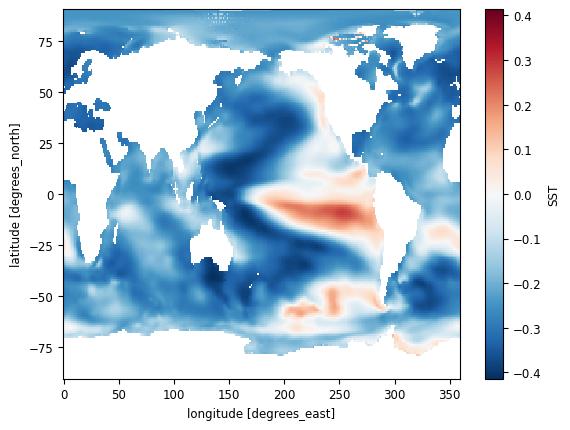

In [317]:
corr_map_all3.mean(dim='ens_ODA').plot.pcolormesh()

In [318]:

start_time = time.time()
from scipy.stats import pearsonr
import xarray as xr
import numpy as np

# 정렬
tws_ts, sst = xr.align(
    cfg_var_TWS.ODA_ds_an['TWS'].sel(lon=12, lat=0, method='nearest'),
    cfg_var_SST.ODA_ds_an['SST'],
    join='inner'
)  # 둘 다 (member, time), (member, time, lat, lon)

# 함수: 단일 멤버에 대해 상관계수 맵 계산
def corr_ts_map(ts, sst_field):
    def pearson_at_point(sst_point):
        if np.isnan(sst_point).all():
            return np.nan
        return pearsonr(ts, sst_point)[0]

    return xr.apply_ufunc(
        pearson_at_point,
        sst_field,
        input_core_dims=[['year']],
        vectorize=True,
        dask='parallelized',
        output_dtypes=[float]
    )

# 멤버별로 반복
corr_maps = []
for m in tws_ts.ens_ODA.values:
    ts_m = tws_ts.sel(ens_ODA=m)
    sst_m = sst.sel(ens_ODA=m)
    corr_m = corr_ts_map(ts_m, sst_m)
    corr_maps.append(corr_m.expand_dims(ens_ODA=[m]))

# stack
corr_map_all4 = xr.concat(corr_maps, dim='ens_ODA')  # (member, lat, lon)

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for corr: ' + str(elapsed_time))

elasped time for corr: 285.8754229545593


In [271]:
#PRECT

# Read LE dataset (PRECT)
start_time = time.time()


cfg_var_PRECT.LE_path_load(cfg_var_PRECT.var)
cfg_var_PRECT.LE_ds = xr.open_mfdataset(cfg_var_PRECT.LE_file_list[0], 
                       chunks={'time': 2}, 
                       combine='nested', 
                       concat_dim=[[*cfg_var_PRECT.LE_ensembles], 'time'], 
                       parallel=True,
                       preprocess=lambda ds: process_coords(ds, start_date, end_date, 'lnd'),
                       decode_cf=True, 
                       decode_times=True)      


cfg_var_PRECT.LE_ds = cfg_var_PRECT.LE_ds.rename({"concat_dim": "ens_LE"})
new_time = cfg_var_PRECT.LE_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var_PRECT.LE_ds.time))
cfg_var_PRECT.LE_ds = cfg_var_PRECT.LE_ds.assign_coords(time=new_time)
cfg_var_PRECT.LE_ds = cfg_var_PRECT.LE_ds.compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading LE: ' + str(elapsed_time))


# Read ODA dataset (projd only)
start_time = time.time()

#PRECT
cfg_var_PRECT.ODA_path_load(cfg_var_PRECT.var)

cfg_var_PRECT.ODA_ds = xr.open_mfdataset(cfg_var_PRECT.ODA_file_list[0][10:20], 
                           chunks={'time': 2}, 
                           combine='nested', 
                           concat_dim=[[*cfg_var_PRECT.ODA_ensembles[10:20]], 'time'], 
                           parallel=True,
                           preprocess=lambda ds: process_coords(ds, start_date, end_date, 'lnd'),
                           decode_cf=True, 
                           decode_times=True)

cfg_var_PRECT.ODA_ds = cfg_var_PRECT.ODA_ds.rename({"concat_dim": "ens_ODA"})
new_time = cfg_var_PRECT.ODA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var_PRECT.ODA_ds.time))
cfg_var_PRECT.ODA_ds = cfg_var_PRECT.ODA_ds.assign_coords(time=new_time)
cfg_var_PRECT.ODA_ds=cfg_var_PRECT.ODA_ds.compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading ODA: ' + str(elapsed_time))


# #Read ADA dataset
# start_time = time.time()

# cfg_var_PRECT.ADA_path_load(cfg_var_PRECT.var)
# cfg_var_PRECT.ADA_ds = xr.open_mfdataset(cfg_var_PRECT.ADA_file_list[0], 
#                        chunks={'time': 2}, 
#                        combine='nested',
#                        concat_dim=[[*cfg_var_PRECT.ADA_ensembles], 'time'], 
#                        parallel=True,
#                        preprocess=lambda ds: process_coords(ds, start_date, end_date, 'lnd'),
#                        decode_cf=True, 
#                        decode_times=True)      


# cfg_var_PRECT.ADA_ds = cfg_var_PRECT.ADA_ds.rename({"concat_dim": "ens_ADA"})
# new_time = cfg_var_PRECT.ADA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var_PRECT.ADA_ds.time))
# cfg_var_PRECT.ADA_ds = cfg_var_PRECT.ADA_ds.assign_coords(time=new_time)
# cfg_var_PRECT.ADA_ds=cfg_var_PRECT.ADA_ds.compute()

# end_time = time.time()
# elapsed_time = end_time - start_time
# print('elasped time for reading ADA: ' + str(elapsed_time))


# Read OBS dataset (PRECT)
start_time = time.time()

cfg_var_PRECT.OBS_path_load(cfg_var_PRECT.var)
# cfg_var_PRECT.OBS_file_list[0]
tmp_comp=cfg_var_PRECT.comp
cfg_var_PRECT.OBS_ds = []
cfg_var_PRECT.OBS_ds = xr.open_mfdataset(cfg_var_PRECT.OBS_file_list[0][0],
                       preprocess=lambda ds: process_coords_obs_atm(ds, start_date, end_date, 'lnd'))

cfg_var_PRECT.OBS_ds = cfg_var_PRECT.OBS_ds.rename({cfg_var_PRECT.OBS_var: cfg_var_PRECT.var})


end_time = time.time()
elapsed_time = end_time - start_time

cfg_var_PRECT.OBS_ds=cfg_var_PRECT.OBS_ds.compute()
# cfg_var_PRECT.OBS_ds = cfg_var_PRECT.OBS_ds.rename({'T': 'time'})
cfg_var_PRECT.OBS_ds=cfg_var_PRECT.OBS_ds.assign_coords(time=cfg_var_PRECT.ODA_ds.time[0:-12])

cfg_var_PRECT.OBS_ds['lat'] = cfg_var_PRECT.ODA_ds['lat']
cfg_var_PRECT.OBS_ds['lon'] = cfg_var_PRECT.ODA_ds['lon']

cfg_var_PRECT.OBS_ds = cfg_var_PRECT.OBS_ds.compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading OBS, ' + ': ' + str(elapsed_time))

elasped time for reading LE: 101.81314873695374
elasped time for reading ODA: 17.33264183998108
elasped time for reading OBS, : 8.212146043777466


In [272]:
# annual mean
obs_non_nan_times = cfg_var_PRECT.OBS_ds[cfg_var_PRECT.var].notnull().any(dim=['lat', 'lon'])
obs_non_nan_times = obs_non_nan_times.compute()
non_nan_time_coords = cfg_var_PRECT.OBS_ds.time.where(obs_non_nan_times, drop=True)
cfg_var_PRECT.ODA_ds_filtered = cfg_var_PRECT.ODA_ds.sel(time=non_nan_time_coords)
cfg_var_PRECT.LE_ds_filtered = cfg_var_PRECT.LE_ds.sel(time=non_nan_time_coords)

cfg_var_PRECT.ODA_ds_an = cfg_var_PRECT.ODA_ds_filtered.groupby('time.year').mean(dim='time', skipna=True).compute()
cfg_var_PRECT.LE_ds_an = cfg_var_PRECT.LE_ds_filtered.groupby('time.year').mean(dim='time', skipna=True).compute()
cfg_var_PRECT.OBS_ds_an = cfg_var_PRECT.OBS_ds.groupby('time.year').mean(dim='time', skipna=True).compute()

# ensmean
cfg_var_PRECT.ODA_ds_an_enm=cfg_var_PRECT.ODA_ds_an[cfg_var_PRECT.var].mean(dim='ens_ODA')
cfg_var_PRECT.LE_ds_an_enm=cfg_var_PRECT.LE_ds_an[cfg_var_PRECT.var].mean(dim='ens_LE')

# corr
corr_ODA_PRECT = xr.corr(cfg_var_PRECT.ODA_ds_an_enm, getattr(cfg_var_PRECT.OBS_ds_an,cfg_var_PRECT.var), dim='year').compute()
corr_LE_PRECT = xr.corr(cfg_var_PRECT.LE_ds_an_enm, getattr(cfg_var_PRECT.OBS_ds_an,cfg_var_PRECT.var), dim='year').compute()

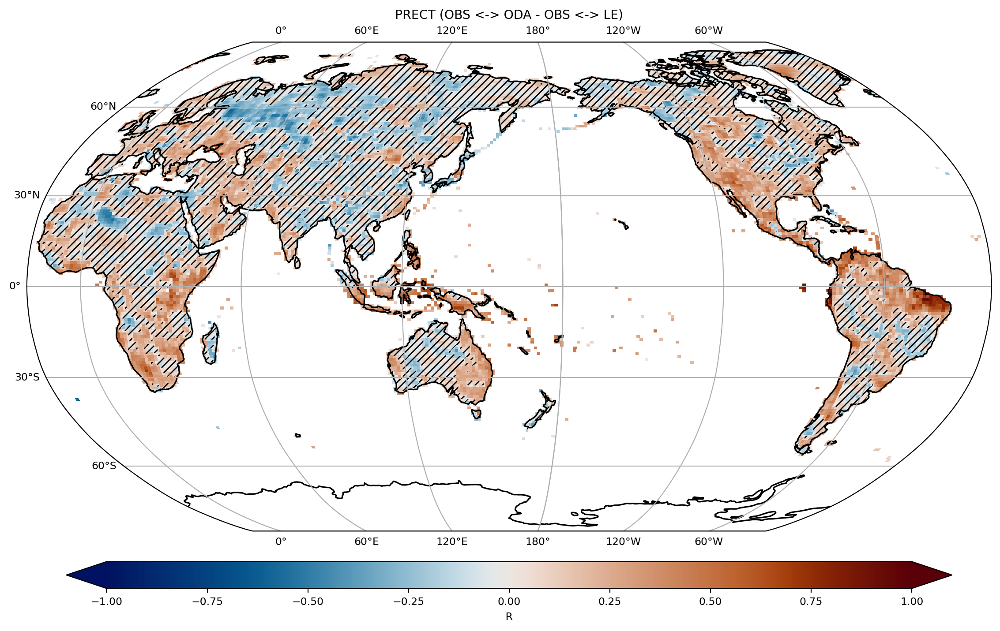

elasped time for figure: 6.266513824462891


In [273]:
# plot for ODA - LE (PRECT)

start_time = time.time()


varn=cfg_var_PRECT.var #example

data_array=corr_ODA_PRECT - corr_LE_PRECT
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,  # 원래 데이터의 차원
    coords=data_array.coords,  # 원래 데이터의 좌표
)

data_array.attrs['name'] = cfg_var_PRECT.var

projection = ccrs.Robinson(central_longitude=160)

plt.rcParams.update({'font.size': 8.5})
fig, ax2 = plt.subplots(1, 1, figsize=(18.5, 9), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection})

cbar_kwargs={'orientation':'horizontal','pad':0.05,'shrink':0.7, 'label':' R ', 'aspect':33, 'extend': 'both'}
if cfg_var_PRECT.comp=='ocn' or cfg_var_PRECT.comp=='ice':
    # plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=0.05, vmin=-0.05,cmap=cm.vik, cbar_kwargs=cbar_kwargs)
    plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, cbar_kwargs=cbar_kwargs)

else:
    plt1=data_array.plot.pcolormesh(ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1, cmap=cm.vik, cbar_kwargs=cbar_kwargs)
contour1 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax2, transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['////'], add_colorbar=False) # works very well



ax2.coastlines(resolution='110m', color='black', linewidth=1.2)

ax2.set_title(f'{varn} (OBS <-> ODA - OBS <-> LE)')
ax2.gridlines(draw_labels=True) 

ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))

plt.show()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for figure: ' + str(elapsed_time))

In [278]:
#GPP

# Read LE dataset (GPP)
start_time = time.time()


cfg_var_GPP.LE_path_load(cfg_var_GPP.var)
cfg_var_GPP.LE_ds = xr.open_mfdataset(cfg_var_GPP.LE_file_list[0], 
                       chunks={'time': 2}, 
                       combine='nested', 
                       concat_dim=[[*cfg_var_GPP.LE_ensembles], 'time'], 
                       parallel=True,
                       preprocess=lambda ds: process_coords(ds, start_date, end_date, 'lnd'),
                       decode_cf=True, 
                       decode_times=True)      


cfg_var_GPP.LE_ds = cfg_var_GPP.LE_ds.rename({"concat_dim": "ens_LE"})
new_time = cfg_var_GPP.LE_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var_GPP.LE_ds.time))
cfg_var_GPP.LE_ds = cfg_var_GPP.LE_ds.assign_coords(time=new_time)
cfg_var_GPP.LE_ds = cfg_var_GPP.LE_ds.compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading LE: ' + str(elapsed_time))


# Read ODA dataset (projd only)
start_time = time.time()

#GPP
cfg_var_GPP.ODA_path_load(cfg_var_GPP.var)

cfg_var_GPP.ODA_ds = xr.open_mfdataset(cfg_var_GPP.ODA_file_list[0][10:20], 
                           chunks={'time': 2}, 
                           combine='nested', 
                           concat_dim=[[*cfg_var_GPP.ODA_ensembles[10:20]], 'time'], 
                           parallel=True,
                           preprocess=lambda ds: process_coords(ds, start_date, end_date, 'lnd'),
                           decode_cf=True, 
                           decode_times=True)

cfg_var_GPP.ODA_ds = cfg_var_GPP.ODA_ds.rename({"concat_dim": "ens_ODA"})
new_time = cfg_var_GPP.ODA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var_GPP.ODA_ds.time))
cfg_var_GPP.ODA_ds = cfg_var_GPP.ODA_ds.assign_coords(time=new_time)
cfg_var_GPP.ODA_ds=cfg_var_GPP.ODA_ds.compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading ODA: ' + str(elapsed_time))


# #Read ADA dataset
# start_time = time.time()

# cfg_var_GPP.ADA_path_load(cfg_var_GPP.var)
# cfg_var_GPP.ADA_ds = xr.open_mfdataset(cfg_var_GPP.ADA_file_list[0], 
#                        chunks={'time': 2}, 
#                        combine='nested',
#                        concat_dim=[[*cfg_var_GPP.ADA_ensembles], 'time'], 
#                        parallel=True,
#                        preprocess=lambda ds: process_coords(ds, start_date, end_date, 'lnd'),
#                        decode_cf=True, 
#                        decode_times=True)      


# cfg_var_GPP.ADA_ds = cfg_var_GPP.ADA_ds.rename({"concat_dim": "ens_ADA"})
# new_time = cfg_var_GPP.ADA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var_GPP.ADA_ds.time))
# cfg_var_GPP.ADA_ds = cfg_var_GPP.ADA_ds.assign_coords(time=new_time)
# cfg_var_GPP.ADA_ds=cfg_var_GPP.ADA_ds.compute()

# end_time = time.time()
# elapsed_time = end_time - start_time
# print('elasped time for reading ADA: ' + str(elapsed_time))


# Read OBS dataset (GPP)
start_time = time.time()

cfg_var_GPP.OBS_path_load(cfg_var_GPP.var)
# cfg_var_GPP.OBS_file_list[0]
tmp_comp=cfg_var_GPP.comp
cfg_var_GPP.OBS_ds = []
cfg_var_GPP.OBS_ds = xr.open_mfdataset(cfg_var_GPP.OBS_file_list[0][0],
                       preprocess=lambda ds: process_coords_obs_atm(ds, start_date, end_date, 'lnd'))

cfg_var_GPP.OBS_ds = cfg_var_GPP.OBS_ds.rename({cfg_var_GPP.OBS_var: cfg_var_GPP.var})


end_time = time.time()
elapsed_time = end_time - start_time

cfg_var_GPP.OBS_ds=cfg_var_GPP.OBS_ds.compute()
# cfg_var_GPP.OBS_ds = cfg_var_GPP.OBS_ds.rename({'T': 'time'})
cfg_var_GPP.OBS_ds=cfg_var_GPP.OBS_ds.assign_coords(time=cfg_var_GPP.ODA_ds.time[29*12:-12])

cfg_var_GPP.OBS_ds['lat'] = cfg_var_GPP.ODA_ds['lat']
cfg_var_GPP.OBS_ds['lon'] = cfg_var_GPP.ODA_ds['lon']

cfg_var_GPP.OBS_ds = cfg_var_GPP.OBS_ds.compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading OBS, ' + ': ' + str(elapsed_time))

elasped time for reading LE: 79.19382619857788
elasped time for reading ODA: 15.513716220855713
elasped time for reading OBS, : 11.406833410263062


In [279]:
# annual mean
obs_non_nan_times = cfg_var_GPP.OBS_ds[cfg_var_GPP.var].notnull().any(dim=['lat', 'lon'])
obs_non_nan_times = obs_non_nan_times.compute()
non_nan_time_coords = cfg_var_GPP.OBS_ds.time.where(obs_non_nan_times, drop=True)
cfg_var_GPP.ODA_ds_filtered = cfg_var_GPP.ODA_ds.sel(time=non_nan_time_coords)
cfg_var_GPP.LE_ds_filtered = cfg_var_GPP.LE_ds.sel(time=non_nan_time_coords)

cfg_var_GPP.ODA_ds_an = cfg_var_GPP.ODA_ds_filtered.groupby('time.year').mean(dim='time', skipna=True).compute()
cfg_var_GPP.LE_ds_an = cfg_var_GPP.LE_ds_filtered.groupby('time.year').mean(dim='time', skipna=True).compute()
cfg_var_GPP.OBS_ds_an = cfg_var_GPP.OBS_ds.groupby('time.year').mean(dim='time', skipna=True).compute()

# ensmean
cfg_var_GPP.ODA_ds_an_enm=cfg_var_GPP.ODA_ds_an[cfg_var_GPP.var].mean(dim='ens_ODA')
cfg_var_GPP.LE_ds_an_enm=cfg_var_GPP.LE_ds_an[cfg_var_GPP.var].mean(dim='ens_LE')

# corr
corr_ODA_GPP = xr.corr(cfg_var_GPP.ODA_ds_an_enm, getattr(cfg_var_GPP.OBS_ds_an,cfg_var_GPP.var), dim='year').compute()
corr_LE_GPP = xr.corr(cfg_var_GPP.LE_ds_an_enm, getattr(cfg_var_GPP.OBS_ds_an,cfg_var_GPP.var), dim='year').compute()

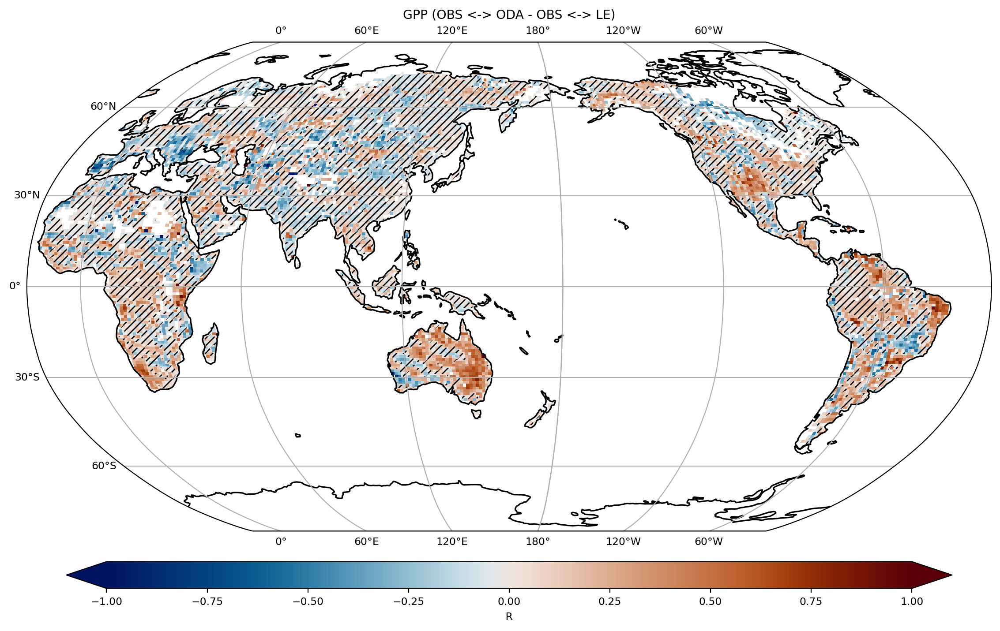

elasped time for figure: 6.867900609970093


In [280]:
# plot for ODA - LE (GPP)

start_time = time.time()


varn=cfg_var_GPP.var #example

data_array=corr_ODA_GPP - corr_LE_GPP
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,  # 원래 데이터의 차원
    coords=data_array.coords,  # 원래 데이터의 좌표
)

data_array.attrs['name'] = cfg_var_GPP.var

projection = ccrs.Robinson(central_longitude=160)

plt.rcParams.update({'font.size': 8.5})
fig, ax2 = plt.subplots(1, 1, figsize=(18.5, 9), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection})

cbar_kwargs={'orientation':'horizontal','pad':0.05,'shrink':0.7, 'label':' R ', 'aspect':33, 'extend': 'both'}
if cfg_var_GPP.comp=='ocn' or cfg_var_GPP.comp=='ice':
    # plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=0.05, vmin=-0.05,cmap=cm.vik, cbar_kwargs=cbar_kwargs)
    plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, cbar_kwargs=cbar_kwargs)

else:
    plt1=data_array.plot.pcolormesh(ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1, cmap=cm.vik, cbar_kwargs=cbar_kwargs)
contour1 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax2, transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['////'], add_colorbar=False) # works very well



ax2.coastlines(resolution='110m', color='black', linewidth=1.2)

ax2.set_title(f'{varn} (OBS <-> ODA - OBS <-> LE)')
ax2.gridlines(draw_labels=True) 

ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))

plt.show()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for figure: ' + str(elapsed_time))

In [283]:
#FAREA_BURNED

# Read LE dataset (FAREA_BURNED)
start_time = time.time()


cfg_var_FAREA_BURNED.LE_path_load(cfg_var_FAREA_BURNED.var)
cfg_var_FAREA_BURNED.LE_ds = xr.open_mfdataset(cfg_var_FAREA_BURNED.LE_file_list[0], 
                       chunks={'time': 2}, 
                       combine='nested', 
                       concat_dim=[[*cfg_var_FAREA_BURNED.LE_ensembles], 'time'], 
                       parallel=True,
                       preprocess=lambda ds: process_coords(ds, start_date, end_date, 'lnd'),
                       decode_cf=True, 
                       decode_times=True)      


cfg_var_FAREA_BURNED.LE_ds = cfg_var_FAREA_BURNED.LE_ds.rename({"concat_dim": "ens_LE"})
new_time = cfg_var_FAREA_BURNED.LE_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var_FAREA_BURNED.LE_ds.time))
cfg_var_FAREA_BURNED.LE_ds = cfg_var_FAREA_BURNED.LE_ds.assign_coords(time=new_time)
cfg_var_FAREA_BURNED.LE_ds = cfg_var_FAREA_BURNED.LE_ds.compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading LE: ' + str(elapsed_time))


# Read ODA dataset (projd only)
start_time = time.time()

#FAREA_BURNED
cfg_var_FAREA_BURNED.ODA_path_load(cfg_var_FAREA_BURNED.var)

cfg_var_FAREA_BURNED.ODA_ds = xr.open_mfdataset(cfg_var_FAREA_BURNED.ODA_file_list[0][10:20], 
                           chunks={'time': 2}, 
                           combine='nested', 
                           concat_dim=[[*cfg_var_FAREA_BURNED.ODA_ensembles[10:20]], 'time'], 
                           parallel=True,
                           preprocess=lambda ds: process_coords(ds, start_date, end_date, 'lnd'),
                           decode_cf=True, 
                           decode_times=True)

cfg_var_FAREA_BURNED.ODA_ds = cfg_var_FAREA_BURNED.ODA_ds.rename({"concat_dim": "ens_ODA"})
new_time = cfg_var_FAREA_BURNED.ODA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var_FAREA_BURNED.ODA_ds.time))
cfg_var_FAREA_BURNED.ODA_ds = cfg_var_FAREA_BURNED.ODA_ds.assign_coords(time=new_time)
cfg_var_FAREA_BURNED.ODA_ds=cfg_var_FAREA_BURNED.ODA_ds.compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading ODA: ' + str(elapsed_time))


# #Read ADA dataset
# start_time = time.time()

# cfg_var_FAREA_BURNED.ADA_path_load(cfg_var_FAREA_BURNED.var)
# cfg_var_FAREA_BURNED.ADA_ds = xr.open_mfdataset(cfg_var_FAREA_BURNED.ADA_file_list[0], 
#                        chunks={'time': 2}, 
#                        combine='nested',
#                        concat_dim=[[*cfg_var_FAREA_BURNED.ADA_ensembles], 'time'], 
#                        parallel=True,
#                        preprocess=lambda ds: process_coords(ds, start_date, end_date, 'lnd'),
#                        decode_cf=True, 
#                        decode_times=True)      


# cfg_var_FAREA_BURNED.ADA_ds = cfg_var_FAREA_BURNED.ADA_ds.rename({"concat_dim": "ens_ADA"})
# new_time = cfg_var_FAREA_BURNED.ADA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var_FAREA_BURNED.ADA_ds.time))
# cfg_var_FAREA_BURNED.ADA_ds = cfg_var_FAREA_BURNED.ADA_ds.assign_coords(time=new_time)
# cfg_var_FAREA_BURNED.ADA_ds=cfg_var_FAREA_BURNED.ADA_ds.compute()

# end_time = time.time()
# elapsed_time = end_time - start_time
# print('elasped time for reading ADA: ' + str(elapsed_time))


# Read OBS dataset (FAREA_BURNED)
start_time = time.time()

cfg_var_FAREA_BURNED.OBS_path_load(cfg_var_FAREA_BURNED.var)
# cfg_var_FAREA_BURNED.OBS_file_list[0]
tmp_comp=cfg_var_FAREA_BURNED.comp
cfg_var_FAREA_BURNED.OBS_ds = []
cfg_var_FAREA_BURNED.OBS_ds = xr.open_mfdataset(cfg_var_FAREA_BURNED.OBS_file_list[0][0],
                       preprocess=lambda ds: process_coords_obs_atm(ds, start_date, end_date, 'lnd'))

cfg_var_FAREA_BURNED.OBS_ds = cfg_var_FAREA_BURNED.OBS_ds.rename({cfg_var_FAREA_BURNED.OBS_var: cfg_var_FAREA_BURNED.var})


end_time = time.time()
elapsed_time = end_time - start_time

cfg_var_FAREA_BURNED.OBS_ds=cfg_var_FAREA_BURNED.OBS_ds.compute()
# cfg_var_FAREA_BURNED.OBS_ds = cfg_var_FAREA_BURNED.OBS_ds.rename({'T': 'time'})
cfg_var_FAREA_BURNED.OBS_ds=cfg_var_FAREA_BURNED.OBS_ds.assign_coords(time=cfg_var_FAREA_BURNED.ODA_ds.time[41*12:])

cfg_var_FAREA_BURNED.OBS_ds['lat'] = cfg_var_FAREA_BURNED.ODA_ds['lat']
cfg_var_FAREA_BURNED.OBS_ds['lon'] = cfg_var_FAREA_BURNED.ODA_ds['lon']

cfg_var_FAREA_BURNED.OBS_ds = cfg_var_FAREA_BURNED.OBS_ds.compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading OBS, ' + ': ' + str(elapsed_time))

elasped time for reading LE: 84.98068189620972
elasped time for reading ODA: 16.790899991989136
elasped time for reading OBS, : 8.266795873641968


In [284]:
# annual mean
obs_non_nan_times = cfg_var_FAREA_BURNED.OBS_ds[cfg_var_FAREA_BURNED.var].notnull().any(dim=['lat', 'lon'])
obs_non_nan_times = obs_non_nan_times.compute()
non_nan_time_coords = cfg_var_FAREA_BURNED.OBS_ds.time.where(obs_non_nan_times, drop=True)
cfg_var_FAREA_BURNED.ODA_ds_filtered = cfg_var_FAREA_BURNED.ODA_ds.sel(time=non_nan_time_coords)
cfg_var_FAREA_BURNED.LE_ds_filtered = cfg_var_FAREA_BURNED.LE_ds.sel(time=non_nan_time_coords)

cfg_var_FAREA_BURNED.ODA_ds_an = cfg_var_FAREA_BURNED.ODA_ds_filtered.groupby('time.year').mean(dim='time', skipna=True).compute()
cfg_var_FAREA_BURNED.LE_ds_an = cfg_var_FAREA_BURNED.LE_ds_filtered.groupby('time.year').mean(dim='time', skipna=True).compute()
cfg_var_FAREA_BURNED.OBS_ds_an = cfg_var_FAREA_BURNED.OBS_ds.groupby('time.year').mean(dim='time', skipna=True).compute()

# ensmean
cfg_var_FAREA_BURNED.ODA_ds_an_enm=cfg_var_FAREA_BURNED.ODA_ds_an[cfg_var_FAREA_BURNED.var].mean(dim='ens_ODA')
cfg_var_FAREA_BURNED.LE_ds_an_enm=cfg_var_FAREA_BURNED.LE_ds_an[cfg_var_FAREA_BURNED.var].mean(dim='ens_LE')

# corr
corr_ODA_FAREA_BURNED = xr.corr(cfg_var_FAREA_BURNED.ODA_ds_an_enm, getattr(cfg_var_FAREA_BURNED.OBS_ds_an,cfg_var_FAREA_BURNED.var), dim='year').compute()
corr_LE_FAREA_BURNED = xr.corr(cfg_var_FAREA_BURNED.LE_ds_an_enm, getattr(cfg_var_FAREA_BURNED.OBS_ds_an,cfg_var_FAREA_BURNED.var), dim='year').compute()

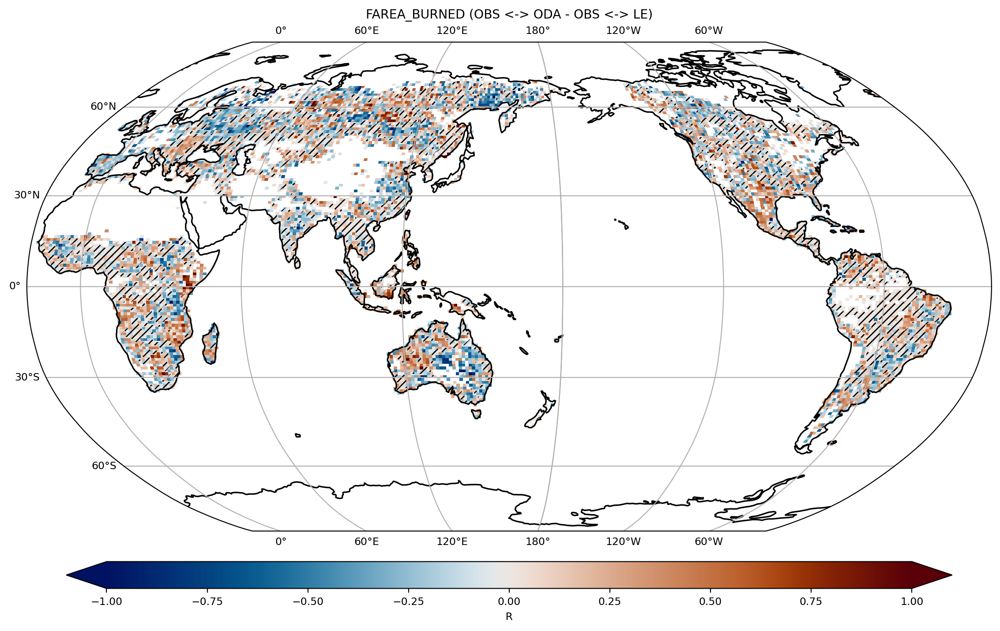

elasped time for figure: 5.696819543838501


In [285]:
# plot for ODA - LE (FAREA_BURNED)

start_time = time.time()


varn=cfg_var_FAREA_BURNED.var #example

data_array=corr_ODA_FAREA_BURNED - corr_LE_FAREA_BURNED
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,  # 원래 데이터의 차원
    coords=data_array.coords,  # 원래 데이터의 좌표
)

data_array.attrs['name'] = cfg_var_FAREA_BURNED.var

projection = ccrs.Robinson(central_longitude=160)

plt.rcParams.update({'font.size': 8.5})
fig, ax2 = plt.subplots(1, 1, figsize=(18.5, 9), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection})

cbar_kwargs={'orientation':'horizontal','pad':0.05,'shrink':0.7, 'label':' R ', 'aspect':33, 'extend': 'both'}
if cfg_var_FAREA_BURNED.comp=='ocn' or cfg_var_FAREA_BURNED.comp=='ice':
    # plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=0.05, vmin=-0.05,cmap=cm.vik, cbar_kwargs=cbar_kwargs)
    plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, cbar_kwargs=cbar_kwargs)

else:
    plt1=data_array.plot.pcolormesh(ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1, cmap=cm.vik, cbar_kwargs=cbar_kwargs)
contour1 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax2, transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['////'], add_colorbar=False) # works very well



ax2.coastlines(resolution='110m', color='black', linewidth=1.2)

ax2.set_title(f'{varn} (OBS <-> ODA - OBS <-> LE)')
ax2.gridlines(draw_labels=True) 

ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))

plt.show()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for figure: ' + str(elapsed_time))

In [341]:
# Read LE dataset (SSH)
start_time = time.time()

cfg_var_SSH.LE_path_load(cfg_var_SSH.var)
cfg_var_SSH.LE_ds = xr.open_mfdataset(cfg_var_SSH.LE_file_list[0][0],
                       preprocess=lambda ds: process_coords_rgd(cfg_var_SSH.var, ds, start_date, end_date, 'ocn'),
                       decode_cf=True, 
                       decode_times=True)      


new_time = cfg_var_SSH.LE_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var_SSH.LE_ds.time))
cfg_var_SSH.LE_ds = cfg_var_SSH.LE_ds.assign_coords(time=new_time)
cfg_var_SSH.LE_ds = cfg_var_SSH.LE_ds.compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading LE: ' + str(elapsed_time))

elasped time for reading LE: 43.97220182418823


In [465]:
# 예: ds = cfg_var_SSH.LE_ds

# 두 시기 정의
period1 = slice('1981-01-01', '2020-12-31')
period2 = slice('2061-01-01', '2100-12-31')

def compute_lag1_autocorr(ds_period):
    # 월별 climatology 계산 (평균, 시간차원에서 월별 평균)
    clim = ds_period.SSH.groupby('time.month').mean('time', skipna=True)
    # anomaly 계산 (각 시점의 값 - 해당 월의 climatology)
    ssh_anom = ds_period.SSH.groupby('time.month') - clim

    # lag-1 autocorrelation 계산 (grid별로)
    def lag1_autocorr(x):
        # x: time vector (1D), shape: (time,)
        # x = x.values  # <<< 이 줄 지우세요!
        if np.any(np.isnan(x)):
            return np.nan
        x1 = x[:-1]
        x2 = x[1:]
        if np.std(x1) == 0 or np.std(x2) == 0:
            return np.nan
        return np.corrcoef(x1, x2)[0, 1]

    # 각 grid에 대해 lag-1 autocorrelation 계산 (time -> lat, lon)
    lag1 = xr.apply_ufunc(
        lag1_autocorr,
        ssh_anom,
        input_core_dims=[['time']],
        vectorize=True,
        dask='parallelized',
        output_dtypes=[float]
    )
    return lag1

# 1. 시기별로 슬라이싱
ds1 = cfg_var_SSH.LE_ds.sel(time=period1)
ds2 = cfg_var_SSH.LE_ds.sel(time=period2)

# 2. 각 시기별 lag-1 autocorrelation 계산
lag1_period1 = compute_lag1_autocorr(ds1)
lag1_period2 = compute_lag1_autocorr(ds2)

# 결과
# lag1_period1, lag1_period2: (lat, lon) grid별 lag-1 자기상관계수 필드

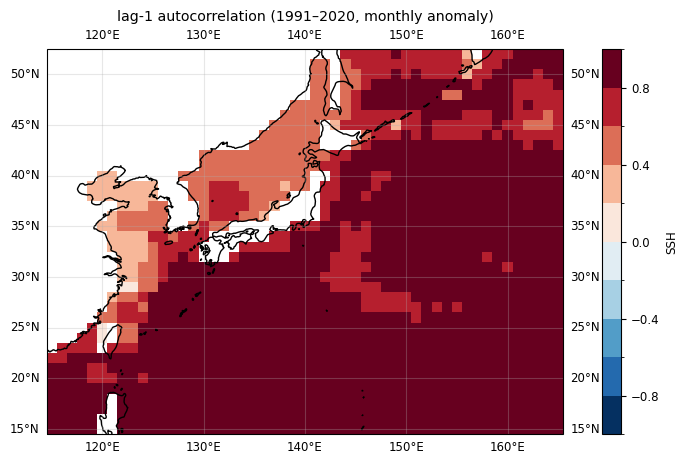

In [466]:
import numpy as np

diff = lag1_period1

plt.figure(figsize=(10, 5))
ax = plt.axes(projection=ccrs.PlateCarree())

# 0.2 단위로 레벨 생성 (-1 ~ 1)
levels = np.arange(-1, 1.01, 0.2)  # 1.01까지 포함해야 1.0 구간도 표현

pcm = diff.sel(lon=slice(115,165)).sel(lat=slice(15,52)).plot.pcolormesh(
    ax=ax, 
    cmap='RdBu_r', 
    vmin=-1, vmax=1,
    add_colorbar=True,
    levels=levels,           # discrete colorbar!
    transform=ccrs.PlateCarree()
)
ax.coastlines()
ax.gridlines(draw_labels=True, alpha=0.3)
plt.title('lag-1 autocorrelation (1991–2020, monthly anomaly)')
plt.show()

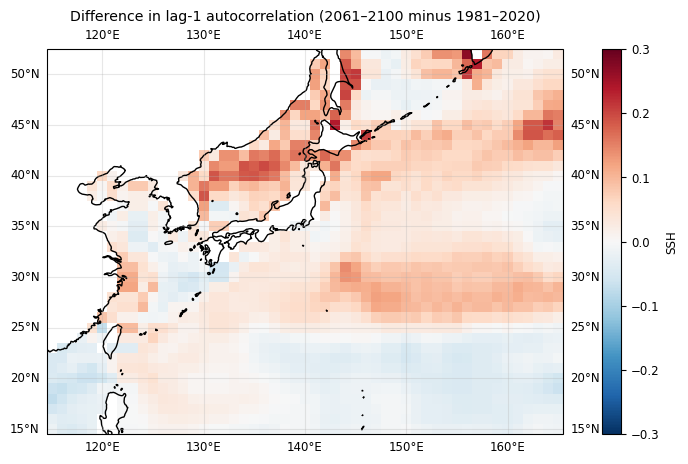

In [467]:
# import cartopy.crs as ccrs

diff = lag1_period2 - lag1_period1

plt.figure(figsize=(10, 5))
ax = plt.axes(projection=ccrs.PlateCarree())
diff.sel(lon=slice(115,165)).sel(lat=slice(15,52)).plot.pcolormesh(
    ax=ax, 
    cmap='RdBu_r', 
    vmin=-0.3, vmax=0.3,
    add_colorbar=True,
    transform=ccrs.PlateCarree()
)
ax.coastlines()
ax.gridlines(draw_labels=True, alpha=0.3)
plt.title('Difference in lag-1 autocorrelation (2061–2100 minus 1981–2020)')
plt.show()

In [375]:
ds_grid = pop_tools.get_grid('POP_gx1v7')


In [377]:
# cfg_var_SSH.OBS_path_load(cfg_var_SSH.var)
# cfg_var_SSH.OBS_ds = xr.open_mfdataset(cfg_var_SSH.OBS_file_list[0][0], 
#                        chunks={'time': 12}, 
#                        parallel=True,
#                        decode_cf=True, 
#                        decode_times=True,)
# cfg_var_SSH.OBS_ds = cfg_var_SSH.OBS_ds.rename({cfg_var_SSH.OBS_var: cfg_var_SSH.var})

# if cfg_var_SSH.var=='SSH':
#     cfg_var_SSH.OBS_ds=cfg_var_SSH.OBS_ds.assign_coords(time=cfg_var_SSH.ODA_ds.time[396:732])
# elif cfg_var_SSH.var=='photoC_TOT_zint_100m':
#     cfg_var_SSH.OBS_ds=cfg_var_SSH.OBS_ds.assign_coords(time=cfg_var_SSH.ODA_ds.time[456:732])
# cfg_var_SSH.OBS_ds.time

# # global mean removal for SSH
# if cfg_var_SSH.var=='SSH':
#     lat_mask = (ds_grid.TLAT >= -60) & (ds_grid.TLAT <= 60)

#     area_selected = ds_grid.TAREA.where(lat_mask, drop=True)  # 선택된 지역의 면적
#     ssh_selected = cfg_var_SSH.OBS_ds[cfg_var_SSH.var].where(lat_mask, drop=True)  # 선택된 지역의 SSH 데이터

#     # 필터링된 지역에 대해 global mean 계산
#     cfg_var_SSH.OBS_ds['gm'] = (ssh_selected * area_selected).sum(dim=['nlat', 'nlon']) / area_selected.sum(dim=['nlat', 'nlon'])
    
#     # 원 데이터에서 global mean을 제거한 값
#     cfg_var_SSH.OBS_ds['SSH'] = cfg_var_SSH.OBS_ds[cfg_var_SSH.var] - cfg_var_SSH.OBS_ds['gm']


# Step 1: 결측값이 아닌 값의 비율 계산
# 결측값이 아닌 값들에 대해 True, 결측값에 대해 False로 표시
valid_data_count = (~cfg_var_SSH.OBS_ds['SSH'].isnull()).sum(dim='time')
# Step 2: 전체 시간 축의 길이 (즉, 데이터가 있어야 할 총 시간 개수)
total_time_steps = cfg_var_SSH.OBS_ds['time'].size
# Step 3: 80% 이상의 값이 있는지 계산
# 비율 계산 후, 80% 이상이면 True, 그렇지 않으면 False로 표시
threshold = 0.8
mask = (valid_data_count / total_time_steps) >= threshold
# Step 4: 마스크 변수를 데이터셋에 추가
cfg_var_SSH.OBS_ds['mask_80_percent'] = mask
cfg_var_SSH.OBS_ds['mask_80_percent'].compute()

<xarray.DataArray 'mask_80_percent' (nlat: 384, nlon: 320)> Size: 123kB
array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])
Coordinates:
    TLONG    (nlat, nlon) float64 983kB 320.6 321.7 322.8 ... 318.9 319.4 319.8
    TLAT     (nlat, nlon) float64 983kB -79.22 -79.22 -79.22 ... 72.19 72.19
Dimensions without coordinates: nlat, nlon

In [378]:
cfg_var_SSH.OBS_ds_rgd = cfg_var_SSH.OBS_ds['SSH'].utils.regrid()

In [379]:
temp_ds=cfg_var_SSH.OBS_ds_rgd.isel(time=slice(0,372))
temp_clim = temp_ds.groupby('time.month').mean('time', skipna=True)
ssh_anom = temp_ds.groupby('time.month') - temp_clim

# # lag-1 autocorrelation 계산 (grid별로)
# def lag1_autocorr(x):
#     # x: time vector (1D), shape: (time,)
#     # x = x.values  # <<< 이 줄 지우세요!
#     if np.any(np.isnan(x)):
#         return np.nan
#     x1 = x[:-1]
#     x2 = x[1:]
#     if np.std(x1) == 0 or np.std(x2) == 0:
#         return np.nan
#     return np.corrcoef(x1, x2)[0, 1]

# # 각 grid에 대해 lag-1 autocorrelation 계산 (time -> lat, lon)
# lag1 = xr.apply_ufunc(
#     lag1_autocorr,
#     ssh_anom,
#     input_core_dims=[['time']],
#     vectorize=True,
#     dask='parallelized',
#     output_dtypes=[float]
# )
# return lag1

In [413]:
from scipy.stats import t

N = 372
alpha = 0.05
df = N - 2

# 2-sided test: 0.025 양쪽
t_critical = t.ppf(1 - alpha/2, df)

# r 임계값
r_critical = t_critical / ( (t_critical**2 + df) ** 0.5 )

print(f"t_critical: {t_critical:.3f}")
print(f"95% significant correlation threshold: {r_critical:.3f}")

t_critical: 1.966
95% significant correlation threshold: 0.102


In [456]:
import numpy as np
import xarray as xr

# anomaly DataArray (time, lat, lon) 준비
# 예: temp_ds = cfg_var_SSH.OBS_ds_rgd.isel(time=slice(0,372))
# temp_clim = temp_ds.groupby('time.month').mean('time', skipna=True)
# ssh_anom = temp_ds.groupby('time.month') - temp_clim
da = ssh_anom.sel(lon=slice(115,165)).sel(lat=slice(15,52))

import numpy as np
import xarray as xr

# anomaly DataArray: (time, lat, lon) 형태로 준비되어 있다고 가정
# da = ssh_anom

max_lag = 36
threshold = 0.102

# def all_lag_stats(x, max_lag=36, thresh=0.2):
#     # 출력 shape = max_lag (lag1~lagN) + max_lag(1개) = max_lag+1
#     if np.any(np.isnan(x)):
#         return np.array([np.nan] * (max_lag + 1))
#     if np.std(x[:-1]) == 0 or np.std(x[1:]) == 0:
#         lag1 = np.nan
#     else:
#         lag1 = np.corrcoef(x[:-1], x[1:])[0, 1]
#     corrs = []
#     for lag in range(2, max_lag + 1):
#         x1 = x[:-lag]
#         x2 = x[lag:]
#         if len(x1)==0 or np.std(x1)==0 or np.std(x2)==0:
#             corrs.append(np.nan)
#         else:
#             corrs.append(np.corrcoef(x1, x2)[0, 1])
#     corrs = np.array(corrs)
#     all_corrs = np.concatenate([[lag1], corrs])
#     mask = all_corrs >= thresh
#     if np.any(mask):
#         max_lag_found = np.where(mask)[0].max() + 1
#     else:
#         max_lag_found = 0
#     return np.concatenate([all_corrs, [max_lag_found]])

def all_lag_stats(x, max_lag=36, thresh=0.102):
    if np.any(np.isnan(x)):
        return np.array([np.nan] * (max_lag + 1))
    if np.std(x[:-1]) == 0 or np.std(x[1:]) == 0:
        lag1 = np.nan
    else:
        lag1 = np.corrcoef(x[:-1], x[1:])[0, 1]
    corrs = []
    for lag in range(2, max_lag + 1):
        x1 = x[:-lag]
        x2 = x[lag:]
        if len(x1)==0 or np.std(x1)==0 or np.std(x2)==0:
            corrs.append(np.nan)
        else:
            corrs.append(np.corrcoef(x1, x2)[0, 1])
    corrs = np.array(corrs)
    all_corrs = np.concatenate([[lag1], corrs])  # len: max_lag

    # 새 로직: 임계값 이하가 처음 등장하는 lag의 직전 lag
    for idx, v in enumerate(all_corrs):
        if v < thresh or np.isnan(v):
            max_lag_found = idx  # 0-based (lag1: 0)
            break
    else:
        max_lag_found = max_lag  # 끝까지 다 넘으면 마지막 lag

    return np.concatenate([all_corrs, [max_lag_found]])


# stat 이름 정의: lag1, lag2~lagmax, max_lag (중복 없음!)
stat_names = ['lag1'] + [f'lag{l}' for l in range(2, max_lag+1)] + ['max_lag']
stat_dim = ['stat']

# apply_ufunc: 결과는 (stat, lat, lon)
result = xr.apply_ufunc(
    all_lag_stats,
    da,
    input_core_dims=[['time']],
    output_core_dims=[stat_dim],
    vectorize=True,
    dask='parallelized',
    output_dtypes=[float],
    kwargs={'max_lag': max_lag, 'thresh': threshold}
)
result = result.assign_coords(stat=stat_names)

# 결과 사용 예시
lag1_field = result.sel(stat='lag1')                # (lat, lon)
max_lag_field = result.sel(stat='max_lag')          # (lat, lon)
lagcorrs_field = result.sel(stat=[f'lag{l}' for l in range(2, max_lag+1)])  # (stat=lag2~lagN, lat, lon)


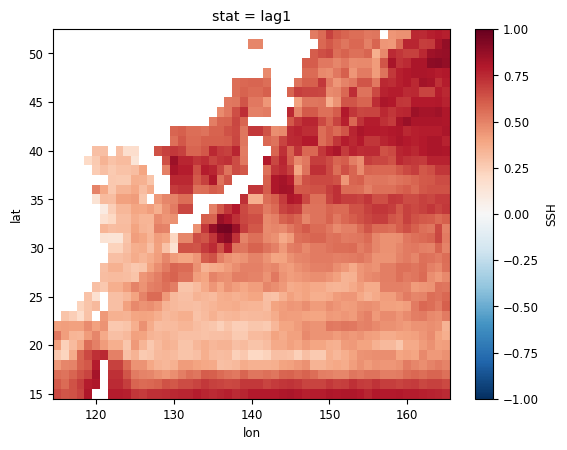

In [457]:
lag1_field.plot.pcolormesh(cmap='RdBu_r', vmin=-1, vmax=1,add_colorbar=True)

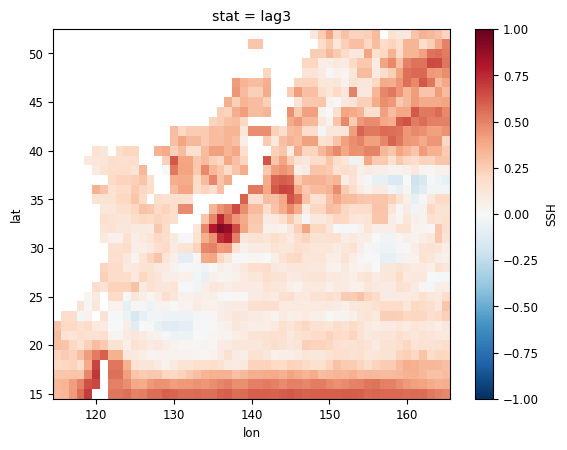

In [462]:
lagcorrs_field.sel(stat='lag3').plot.pcolormesh(cmap='RdBu_r', vmin=-1, vmax=1,add_colorbar=True)

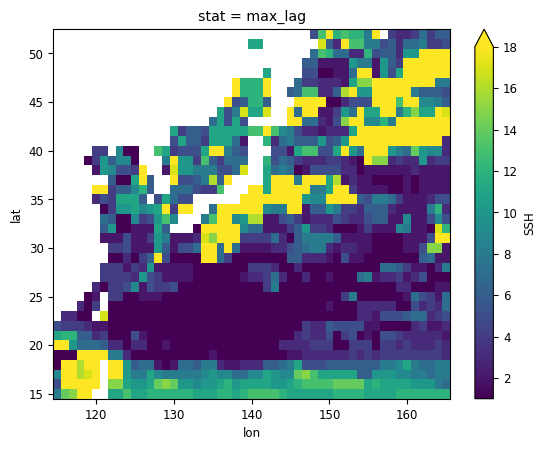

In [461]:
max_lag_field.plot.pcolormesh(vmin=1, vmax=18, extend='max')

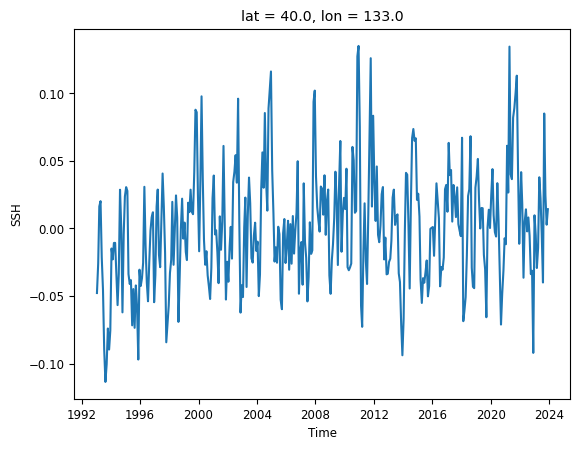

In [463]:
ssh_anom.sel(lon=133,lat=40, method='nearest').plot()

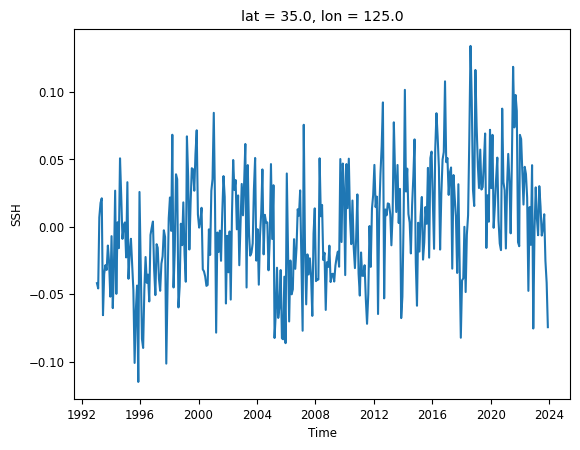

In [391]:
ssh_anom.sel(lon=125,lat=35, method='nearest').plot()

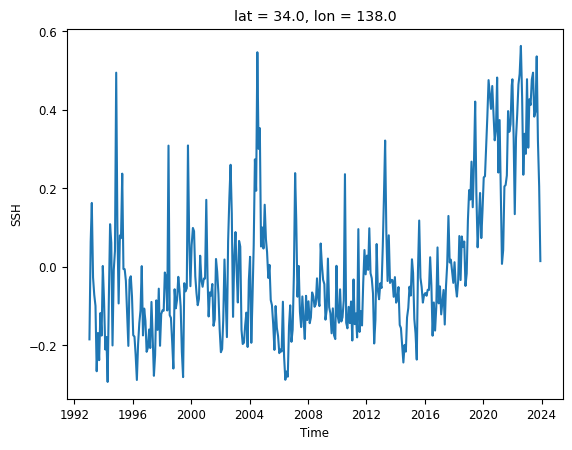

In [392]:
ssh_anom.sel(lon=138,lat=34, method='nearest').plot()

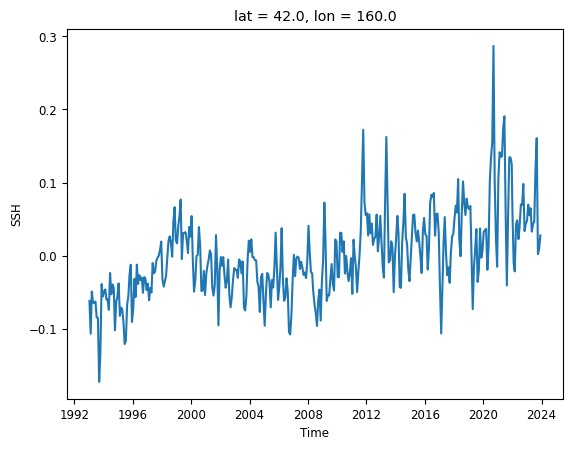

In [464]:
ssh_anom.sel(lon=160,lat=42, method='nearest').plot()

In [477]:
import numpy as np
import xarray as xr

# anomaly DataArray (time, lat, lon) 준비
# 예: temp_ds = cfg_var_SSH.OBS_ds_rgd.isel(time=slice(0,372))
# temp_clim = temp_ds.groupby('time.month').mean('time', skipna=True)
# ssh_anom = temp_ds.groupby('time.month') - temp_clim
da = ssh_anom.sel(lon=slice(80,180)).sel(lat=slice(-20,60))
da = da.rolling(time=3, center=True).mean()
da = da.isel(time=slice(1, -1))

import numpy as np
import xarray as xr

# anomaly DataArray: (time, lat, lon) 형태로 준비되어 있다고 가정
# da = ssh_anom

max_lag = 24
threshold = 0.3679

# def all_lag_stats(x, max_lag=36, thresh=0.2):
#     # 출력 shape = max_lag (lag1~lagN) + max_lag(1개) = max_lag+1
#     if np.any(np.isnan(x)):
#         return np.array([np.nan] * (max_lag + 1))
#     if np.std(x[:-1]) == 0 or np.std(x[1:]) == 0:
#         lag1 = np.nan
#     else:
#         lag1 = np.corrcoef(x[:-1], x[1:])[0, 1]
#     corrs = []
#     for lag in range(2, max_lag + 1):
#         x1 = x[:-lag]
#         x2 = x[lag:]
#         if len(x1)==0 or np.std(x1)==0 or np.std(x2)==0:
#             corrs.append(np.nan)
#         else:
#             corrs.append(np.corrcoef(x1, x2)[0, 1])
#     corrs = np.array(corrs)
#     all_corrs = np.concatenate([[lag1], corrs])
#     mask = all_corrs >= thresh
#     if np.any(mask):
#         max_lag_found = np.where(mask)[0].max() + 1
#     else:
#         max_lag_found = 0
#     return np.concatenate([all_corrs, [max_lag_found]])

def all_lag_stats(x, max_lag=36, thresh=0.3679):
    if np.any(np.isnan(x)):
        return np.array([np.nan] * (max_lag + 1))
    if np.std(x[:-1]) == 0 or np.std(x[1:]) == 0:
        lag1 = np.nan
    else:
        lag1 = np.corrcoef(x[:-1], x[1:])[0, 1]
    corrs = []
    for lag in range(2, max_lag + 1):
        x1 = x[:-lag]
        x2 = x[lag:]
        if len(x1)==0 or np.std(x1)==0 or np.std(x2)==0:
            corrs.append(np.nan)
        else:
            corrs.append(np.corrcoef(x1, x2)[0, 1])
    corrs = np.array(corrs)
    all_corrs = np.concatenate([[lag1], corrs])  # len: max_lag

    # 새 로직: 임계값 이하가 처음 등장하는 lag의 직전 lag
    for idx, v in enumerate(all_corrs):
        if v < thresh or np.isnan(v):
            max_lag_found = idx  # 0-based (lag1: 0)
            break
    else:
        max_lag_found = max_lag  # 끝까지 다 넘으면 마지막 lag

    return np.concatenate([all_corrs, [max_lag_found]])

# stat 이름 정의: lag1, lag2~lagmax, max_lag (중복 없음!)
stat_names = ['lag1'] + [f'lag{l}' for l in range(2, max_lag+1)] + ['max_lag']
stat_dim = ['stat']

# apply_ufunc: 결과는 (stat, lat, lon)
result = xr.apply_ufunc(
    all_lag_stats,
    da,
    input_core_dims=[['time']],
    output_core_dims=[stat_dim],
    vectorize=True,
    dask='parallelized',
    output_dtypes=[float],
    kwargs={'max_lag': max_lag, 'thresh': threshold}
)
result = result.assign_coords(stat=stat_names)

# 결과 사용 예시
lag1_field = result.sel(stat='lag1')                # (lat, lon)
max_lag_field = result.sel(stat='max_lag')          # (lat, lon)
lagcorrs_field = result.sel(stat=[f'lag{l}' for l in range(2, max_lag+1)])  # (stat=lag2~lagN, lat, lon)




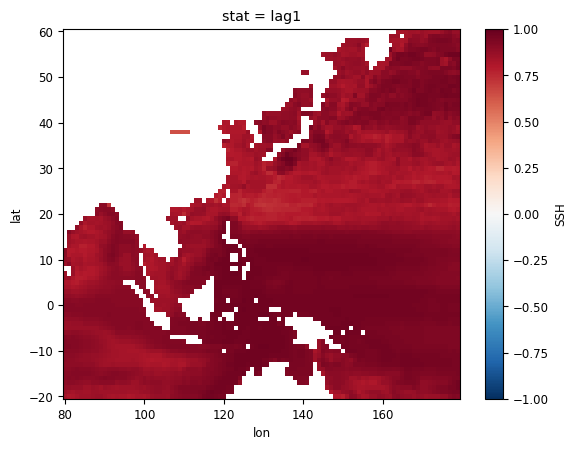

In [480]:
lag1_field.plot.pcolormesh(cmap='RdBu_r', vmin=-1, vmax=1,add_colorbar=True)

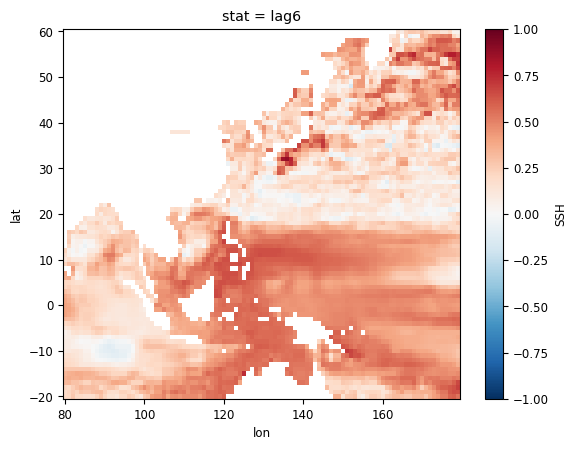

In [483]:
lagcorrs_field.sel(stat='lag6').plot.pcolormesh(cmap='RdBu_r', vmin=-1, vmax=1,add_colorbar=True)

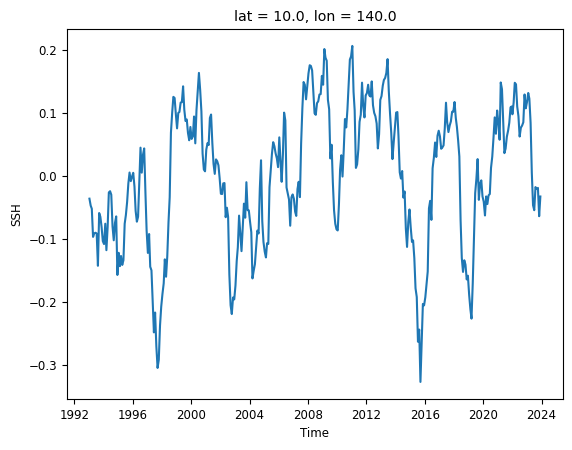

In [484]:
ssh_anom.sel(lon=140,lat=10, method='nearest').plot()

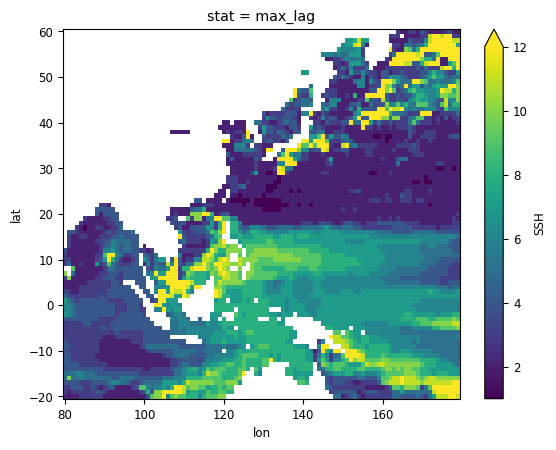

In [481]:
max_lag_field.plot.pcolormesh(vmin=1, vmax=12, extend='max')